In [793]:
%load_ext autoreload
%autoreload 2
from autogluon.timeseries import TimeSeriesDataFrame
import pandas as pd
import numpy as np
from pathlib import Path
from src.data.preprocessor import read_smard_data, read_exchange_rates_data
#from src.core.base import set_seed
from src.core.timeseries_evaluation import get_crps_scores
from src.postprocessors.mle import PostprocessorMLE
from src.postprocessors.qr import PostprocessorQR, PostprocessorFastQR
from src.postprocessors.eqc import PostprocessorEQC
from src.predictors.quantile_regression import QuantileRegression
from src.pipeline.pipeline import ForecastingPipeline
from src.predictors.chronos import Chronos
from src.predictors.quantile_regression import QuantileRegression
from src.predictors.benchmarks import OnlineRandomWalk

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read data

In [91]:
import os

path= Path("/Users/louisskowronek/Documents/results/results")
files = [f for f in os.listdir(path) if "Bolt-base" in f]# if os.path.isfile(os.path.join(path, f))]

In [92]:
model = "Chronos-Bolt-base"
model = "Chronos-Bolt-base-FT_Full-PP_Offset"
model = "Chronos-Bolt-base-FT_Full-PP_QuantReg"
model = "Chronos-Bolt-base-FT_LongOut-PP_Offset"
model = "Chronos-Bolt-base-FT_LongOut"
files = [f for f in files if model in f and "PP" not in f]

In [97]:
list = []
for f in files:
    list.append(pd.read_csv(path / f / "all_results.csv"))

df = pd.concat(list)

In [99]:
df["model"] = model

In [100]:
df.drop_duplicates("dataset").to_csv("/Users/louisskowronek/Documents/thesis/master-thesis/gift-eval-huggingface/GIFT-Eval/" + model + ".csv", index=False)

- motivation für ansätze 
- chronos t5 als base, wahlweise genauer analysieren.
- chronos bolt
- für jeden einen spezifischen benchmark 
    - großhandelspreise (benchmark: nearest neighbour, seasonal rolling window)
    - realisierter stromverbrauch
    - exchange rates (benchmark: letzte 20 Datenpunkte, rolling window)
- nach chronos t5 anfangen aufzuschreiben.
- insbesondere auch evaluation aufschreiben. (was wird für training, testing eval verwendet usw.)


In [ ]:
# QR:
# realisierter stromverbrauch: no transformation, maybe standardization
# grosshandelspreise: arcsin
# exchange rates 

# MLE:
# use yeo-johnson transformation


# use separate data transformer for each postprocessor

In [3]:
mapping

{0: 'Belgium [€/MWh] Original resolutions',
 1: 'Denmark 1 [€/MWh] Original resolutions',
 2: 'Denmark 2 [€/MWh] Original resolutions',
 3: 'France [€/MWh] Original resolutions',
 4: 'Netherlands [€/MWh] Original resolutions',
 5: 'Norway 2 [€/MWh] Original resolutions',
 6: 'Sweden 4 [€/MWh] Original resolutions',
 7: 'Switzerland [€/MWh] Original resolutions',
 8: 'Czech Republic [€/MWh] Original resolutions',
 9: 'Slovenia [€/MWh] Original resolutions',
 10: 'Hungary [€/MWh] Original resolutions'}

In [794]:
data, mapping = read_smard_data(

            file_paths=[
                "./data/day_ahead_prices/Day-ahead_prices_201501010000_202001010000_Hour.csv",
                "./data/day_ahead_prices/Day-ahead_prices_202001010000_202509010000_Hour.csv",
            ],
            selected_time_series=[
                "Belgium [€/MWh] Original resolutions",
                "Denmark 1 [€/MWh] Original resolutions",
                "Denmark 2 [€/MWh] Original resolutions",
                "France [€/MWh] Original resolutions",
                "Netherlands [€/MWh] Original resolutions",
                "Norway 2 [€/MWh] Original resolutions",
                "Sweden 4 [€/MWh] Original resolutions",
                "Switzerland [€/MWh] Original resolutions",
                "Czech Republic [€/MWh] Original resolutions",
                "Slovenia [€/MWh] Original resolutions",
                "Hungary [€/MWh] Original resolutions",
            ],
            freq="1 h",
)

2025-09-18 18:45:52,138 - INFO - <string> - Reading SMARD data...
2025-09-18 18:45:52,138 - INFO - <string> - Reading file: ./data/day_ahead_prices/Day-ahead_prices_201501010000_202001010000_Hour.csv
2025-09-18 18:45:52,342 - INFO - <string> - Reading file: ./data/day_ahead_prices/Day-ahead_prices_202001010000_202509010000_Hour.csv
2025-09-18 18:45:52,599 - INFO - <string> - Total rows after concat: 93503
2025-09-18 18:45:52,603 - INFO - <string> - Filtering columns: ['Belgium [€/MWh] Original resolutions', 'Denmark 1 [€/MWh] Original resolutions', 'Denmark 2 [€/MWh] Original resolutions', 'France [€/MWh] Original resolutions', 'Netherlands [€/MWh] Original resolutions', 'Norway 2 [€/MWh] Original resolutions', 'Sweden 4 [€/MWh] Original resolutions', 'Switzerland [€/MWh] Original resolutions', 'Czech Republic [€/MWh] Original resolutions', 'Slovenia [€/MWh] Original resolutions', 'Hungary [€/MWh] Original resolutions']
2025-09-18 18:45:52,605 - INFO - <string> - Columns retained: ['En

In [467]:
d = data.isna().groupby("item_id").sum()

In [468]:
d["target"] / 93504

item_id
0     0.351536
1     0.458804
2     0.001262
3     0.000235
4     0.000235
5     0.001519
6     0.001262
7     0.000749
8     0.351536
9     0.305078
10    0.000492
11    0.000492
12    0.000235
13    0.649726
14    0.093900
15    0.000235
16    0.000749
Name: target, dtype: float64

In [469]:
missing_vals = data.isna().groupby("item_id").sum()

In [ ]:
mapping

In [ ]:
[v for k, v in mapping.items() if k in missing_vals[missing_vals.values > 150].index]

In [ ]:
[v for k, v in mapping.items() if k in missing_vals[missing_vals.values < 150].index]

In [3]:
data_train, data_test = data.split_by_time(pd.Timestamp("2024-01-01 23:00:00"))

In [530]:
data, mapping = read_exchange_rates_data(files_dir="data/exchange_rates/")

2025-09-13 18:48:10,231 - INFO - preprocessor.py - Reading exchange rates data...
2025-09-13 18:48:10,232 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXCAUS.csv
2025-09-13 18:48:10,239 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXCHUS.csv
2025-09-13 18:48:10,245 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXJPUS.csv
2025-09-13 18:48:10,251 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXSIUS.csv
2025-09-13 18:48:10,257 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXSZUS.csv
2025-09-13 18:48:10,263 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXUSAL.csv
2025-09-13 18:48:10,269 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXUSNZ.csv
2025-09-13 18:48:10,275 - INFO - preprocessor.py - Reading file: data/exchange_rates/DEXUSUK.csv
2025-09-13 18:48:10,282 - INFO - preprocessor.py - Total rows after concatenation: 9304
2025-09-13 18:48:10,285 - INFO - preprocessor.py - Res

In [541]:
mapping

{0: 'USCA',
 1: 'USCH',
 2: 'USJP',
 3: 'USSI',
 4: 'USSZ',
 5: 'USAL',
 6: 'USNZ',
 7: 'USUK'}

#### check calibration samples

In [780]:
lead_times = np.arange(1, 640+1).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "finetuning_schedule": ["full"], "finetuning_adjust_pretrained_prediction_length": True, "finetuning_warmup_new_neurons": True}, 
                               postprocessors=[PostprocessorEQC, PostprocessorFastQR],
                               #postprocessor_kwargs=[{"n_jobs":1}, {"n_jobs":1, "transformer": None}],
                               freq="15 min",
                               output_dir=Path("./results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length"))

2025-09-15 12:25:23,300 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/models/Chronos
2025-09-15 12:25:23,302 - INFO - chronos.py - Loading Chronos pipeline from model: amazon/chronos-bolt-tiny
2025-09-15 12:25:23,303 - INFO - chronos.py - Initializing Chronos pipeline with model: amazon/chronos-bolt-tiny
2025-09-15 12:25:24,757 - INFO - chronos.py - Prepended 'new_neurons' for warm-up of new output rows.
2025-09-15 12:25:24,757 - INFO - chronos.py - Final fine-tuning schedule: new_neurons → full
2025-09-15 12:25:24,757 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-15 12:25:24,758 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/

In [792]:
640 / 80

8.0

In [789]:
pipeline.auto_generate_calibration_config(data, prediction_length=640, max_calibration_samples=200)

2025-09-15 12:31:03,120 - WARNING - <string> - Using sampling_method='fixed_stride'. Note: if prediction_length << seasonality and max_calibration_samples is small, calibration coverage may be poor. Consider sampling_method='random' instead. TODO: add option to account for seasonality when selecting calibration samples.


{93504: 640}

In [790]:
93504 // 200

467

In [786]:
93504 / 160

584.4

In [51]:
np.ceil(11 / 2)

6.0

In [42]:
results = pipeline.backtest(
    data=data,
    test_start_date=pd.Timestamp("01-01-2023"),
    rolling_window_eval=False,
    train=False,
    val_window_size=None,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="auto",
    save_results=True,
    test_window_step=96,
    calibration_window_step=96,
    auto_determine_val_set=False,
)

2025-09-01 12:32:21,883 - INFO - pipeline.py - Start E2E backtesting...
2025-09-01 12:32:21,895 - INFO - pipeline.py - Starting data split operation.
2025-09-01 12:32:21,915 - INFO - pipeline.py - Data split operation completed successfully.
2025-09-01 12:32:21,915 - INFO - <string> - Removing all item_ids which contain only nans in target column.
2025-09-01 12:32:21,929 - INFO - <string> - Skipping model training because `train=False`.
2025-09-01 12:32:21,943 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2023-01-01 00:00:00 to 2025-09-01 00:00:00


Predicting using Chronos:   0%|          | 0/4 [00:00<?, ?it/s]

2025-09-01 12:32:24,206 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 2.26
2025-09-01 12:32:24,287 - WARNING - <string> - Using sampling_method='fixed_stride'. Note: if prediction_length << seasonality and max_calibration_samples is small, calibration coverage may be poor. Consider sampling_method='random' instead. TODO: add option to account for seasonality when selecting calibration samples.
2025-09-01 12:32:24,288 - INFO - <string> - Calibration samples per time series: {0: 50, 1: 50}
2025-09-01 12:32:24,288 - INFO - <string> - Generating forecasts on calibration data...
2025-09-01 12:32:24,298 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2015-01-01 00:15:00 to 2022-12-31 23:45:00


Predicting using Chronos:   0%|          | 0/1 [00:00<?, ?it/s]

2025-09-01 12:32:24,888 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 0.59
2025-09-01 12:32:24,889 - INFO - pipeline.py - Start training postprocessors...
2025-09-01 12:32:24,889 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-01 12:32:24,890 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 2/2 [00:00<00:00, 281.02it/s]
2025-09-01 12:32:24,898 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.01
Fitting PostprocessorFastQR for each time series (item): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]
2025-09-01 12:32:25,409 - INFO - base.py - Time to fit PostprocessorFastQR in seconds: 0.51
2025-09-01 12:

In [7]:
from src.core.timeseries_evaluation import get_crps_scores

In [ ]:

val_window_step = min(pipeline.predictor.prediction_length, pipeline.predictor.model_internal_prediction_length)
max_val_windows = max(1, pipeline.predictor.prediction_length // val_window_step)
pipeline.train_predictor_model(data_train, val_window_step=val_window_step, max_val_windows=max_val_windows)


In [29]:
# result = pipeline.generate_forecasts(data_test=data_sub)
calibration_preds = pipeline.auto_generate_calibration_forecasts(data_sub, max_calibration_samples=10000)


2025-08-28 11:00:09,041 - INFO - pipeline.py - Automatically determined calibration window_step: 16
2025-08-28 11:00:09,048 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2015-01-01 00:15:00 to 2017-11-07 16:00:00


Predicting using Chronos:   0%|          | 0/13 [00:00<?, ?it/s]

/Users/louisskowronek/Documents/thesis/master-thesis/chronos-forecasting/src/chronos/chronos_bolt.py:627: UserWarning: We recommend keeping prediction length <= 64. The quality of longer predictions may degrade since the model is not optimized for it. 
  warnings.warn(msg)
2025-08-28 11:00:18,896 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 9.85


In [17]:
calibration_preds["Chronos"].get_time_series_forecast(0).to_dataframe(1)

0.1           0.2           0.3   
item_id timestamp                                                       
0       2015-01-08 18:15:00  18147.148438  18291.515625  18378.871094  \
        2015-01-10 02:15:00  11576.886719  11695.443359  11770.151367   

                                      0.4           0.5           0.6   
item_id timestamp                                                       
0       2015-01-08 18:15:00  18459.273438  18550.207031  18640.332031  \
        2015-01-10 02:15:00  11829.764648  11894.518555  11962.548828   

                                      0.7           0.8           0.9   
item_id timestamp                                                       
0       2015-01-08 18:15:00  18729.804688  18852.572266  19029.339844  \
        2015-01-10 02:15:00  12031.376953  12117.553711  12258.311523   

                                prediction_date    target  current  
item_id timestamp                                                   
0       2015-01-08 18:15:00 2015-01-08 18:30:00  18415.50  18455.0  
        2015-01-10 02:15:00 2015-01-10 02:30:00  11770.75  11842.5

In [21]:
pipeline.train_postprocessors(calibration_preds["Chronos"])

2025-08-28 10:50:50,636 - INFO - pipeline.py - Start training postprocessors...
2025-08-28 10:50:50,637 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-08-28 10:50:50,637 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 1/1 [00:00<00:00, 30.40it/s]
2025-08-28 10:50:50,672 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.03
Fitting PostprocessorFastQR for each time series (item): 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]
2025-08-28 10:50:51,487 - INFO - base.py - Time to fit PostprocessorFastQR in seconds: 0.81
2025-08-28 10:50:51,487 - INFO - pipeline.py - Postprocessors training completed in 0.850211 seconds.


In [18]:
pipeline.train_postprocessors(calibration_preds["Chronos"])
# result = self.pipeline.apply_postprocessors_to_forecasts(result)


2025-08-28 10:50:09,040 - INFO - pipeline.py - Start training postprocessors...
2025-08-28 10:50:09,041 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-08-28 10:50:09,041 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 1/1 [00:00<00:00, 27.09it/s]
2025-08-28 10:50:09,080 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.04
Fitting PostprocessorFastQR for each time series (item): 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]
2025-08-28 10:50:10,023 - INFO - base.py - Time to fit PostprocessorFastQR in seconds: 0.94
2025-08-28 10:50:10,023 - INFO - pipeline.py - Postprocessors training completed in 0.982212 seconds.


In [170]:
import pandas as pd
# If you want an AutoGluon TimeSeriesDataFrame back, uncomment these:
# from autogluon.timeseries import TimeSeriesDataFrame

def duplicate_timeseries_with_new_ids(df: pd.DataFrame, repeats: int = 1, return_type: str = "pandas"):
    """
    Duplicate a (item_id, timestamp) MultiIndex time series dataframe 'repeats' times,
    giving every duplicated series a fresh unique item_id.

    Parameters
    ----------
    df : pandas.DataFrame
        Must have a MultiIndex with names ['item_id', 'timestamp'].
    repeats : int
        How many full copies to add.
    return_type : {"pandas", "autogluon"}
        Choose return format.

    Returns
    -------
    pandas.DataFrame or AutoGluon TimeSeriesDataFrame
    """
    if list(df.index.names) != ["item_id", "timestamp"]:
        raise ValueError("Index must be a MultiIndex with names ['item_id', 'timestamp'].")

    item_ids = df.index.get_level_values("item_id").unique()
    n = len(item_ids)
    is_int_ids = pd.api.types.is_integer_dtype(item_ids.dtype)

    base_frames = [df]

    # For numeric ids, allocate disjoint integer ranges.
    # For string ids, append a suffix per repeat to guarantee uniqueness.
    for r in range(1, repeats + 1):
        mapping = {}
        if is_int_ids:
            start = int(item_ids.max()) + 1 + (r - 1) * n
            # assign consecutive new ids to the original item_id order
            for i, _old in enumerate(item_ids):
                mapping[_old] = start + i
        else:
            # make id like "<old>__dup<r>"
            for _old in item_ids:
                mapping[_old] = f"{_old}__dup{r}"

        tmp = df.reset_index()
        tmp["item_id"] = tmp["item_id"].map(mapping)
        dup = tmp.set_index(["item_id", "timestamp"]).sort_index()
        base_frames.append(dup)

    out = pd.concat(base_frames).sort_index()

    if return_type == "autogluon":
        from autogluon.timeseries import TimeSeriesDataFrame
        return TimeSeriesDataFrame(out)
    return out

# --- Example usage ---
# big_df = duplicate_timeseries_with_new_ids(df, repeats=10, return_type="autogluon")
# print(big_df.index.get_level_values("item_id").nunique())  # should be (original_n * (1 + repeats))


In [174]:
data = duplicate_timeseries_with_new_ids(data, 10)

In [3]:
lead_times = np.arange(1, 640+1).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()

In [ ]:
from src.pipeline.pipeline import ForecastingPipeline
from src.predictors.tirex import TiRex

pipeline = ForecastingPipeline(model=TiRex,
                               model_kwargs={"lead_times": [1,2,3,4,5,6,7,8,9]},
                               freq="15 min",
                               output_dir=Path("./results/pipeline/tirex"))
#data_test = data.slice_by_timestep(10,100)
#results = pipeline.generate_forecasts(data, rolling=True, window_step=100)

In [795]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "finetuning_schedule": ["full"], "finetuning_adjust_pretrained_prediction_length": True, "finetuning_warmup_new_neurons": True}, 
                               postprocessors=[PostprocessorEQC, PostprocessorFastQR],
                               #postprocessor_kwargs=[{"n_jobs":1}, {"n_jobs":1, "transformer": None}],
                               freq="15 min",
                               output_dir=Path("./results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length"))

2025-09-18 18:46:05,064 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/models/Chronos
2025-09-18 18:46:05,065 - INFO - chronos.py - Loading Chronos pipeline from model: amazon/chronos-bolt-tiny
2025-09-18 18:46:05,065 - INFO - chronos.py - Initializing Chronos pipeline with model: amazon/chronos-bolt-tiny
2025-09-18 18:46:06,607 - INFO - chronos.py - Prepended 'new_neurons' for warm-up of new output rows.
2025-09-18 18:46:06,607 - INFO - chronos.py - Final fine-tuning schedule: new_neurons → full
2025-09-18 18:46:06,608 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-18 18:46:06,608 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/

In [798]:
pipeline.predictor.pipeline.inner_model.model_dim

256

In [8]:
from src.predictors.benchmarks import SeasonalNaive

In [39]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=OnlineRandomWalk, 
                               model_kwargs={"lead_times": lead_times,},# "freq":"15min"}, 
                               postprocessors=[PostprocessorEQC, PostprocessorFastQR],
                               #postprocessor_kwargs=[{"n_jobs":1}, {"n_jobs":1, "transformer": None}],
                               freq="15 min",
                               output_dir=Path("./results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length"))

2025-09-05 18:46:27,944 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/models/OnlineRandomWalk
2025-09-05 18:46:27,944 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-05 18:46:27,944 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR


In [38]:
lead_times = np.arange(1, (64 * 10) + 1).tolist()
quantiles = np.round(np.arange(0.1, 1, 0.1), 1).tolist()
test_start_date = pd.Timestamp("2025-01-01")
postprocessors = [PostprocessorEQC, PostprocessorFastQR, PostprocessorMLE]
postprocessor_kwargs = [
    {"n_jobs": 8, "name": "PP_Offset"},
    {"n_jobs": 4, "name": "PP_QuantReg", "device": "cpu"},
    {"n_jobs": 8, "name": "PP_Gauss"},
]
freq = "15 min"
output_dir = Path("./results/electricity_consumption_RW/pipeline/")
val_window_size = pd.DateOffset(years=1)
test_window_step = 96
calibration_window_step = 96*5
auto_calibration = "auto"

# pipeline = ForecastingPipeline(
#     model=OnlineRandomWalk,
#     model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "name": "OnlineRandomWalk"},
#     postprocessors=postprocessors,
#     postprocessor_kwargs=postprocessor_kwargs,
#     output_dir=output_dir / "OnlineRandomWalk",
#     freq=freq,
# )

results = pipeline.backtest(
    data=data,
    test_start_date=test_start_date,
    rolling_window_eval=False,
    train=False,
    val_window_size=val_window_size,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on=auto_calibration or "train_val",
    save_results=True,
    test_window_step=test_window_step,
    calibration_window_step=calibration_window_step,
    auto_determine_val_set=False,
)

2025-09-05 18:44:51,274 - INFO - pipeline.py - Start E2E backtesting...
2025-09-05 18:44:51,278 - INFO - pipeline.py - Starting data split operation.
2025-09-05 18:44:51,298 - INFO - pipeline.py - Data split operation completed successfully.
2025-09-05 18:44:51,299 - INFO - pipeline.py - Removing all item_ids which contain only nans in target column.
2025-09-05 18:44:51,303 - INFO - pipeline.py - Skipping model training because `train=False`.
2025-09-05 18:44:51,314 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2025-01-01 00:00:00 to 2025-09-01 00:00:00


Predicting using Chronos:   0%|          | 0/4 [00:00<?, ?it/s]

2025-09-05 18:44:54,541 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 3.23
2025-09-05 18:44:54,613 - WARNING - pipeline.py - Using sampling_method='fixed_stride'. Note: if prediction_length << seasonality and max_calibration_samples is small, calibration coverage may be poor. Consider sampling_method='random' instead. TODO: add option to account for seasonality when selecting calibration samples.
2025-09-05 18:44:54,614 - INFO - pipeline.py - Calibration samples per time series: {0: 200, 1: 200}
2025-09-05 18:44:54,614 - INFO - pipeline.py - Generating forecasts on calibration data...
2025-09-05 18:44:54,622 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2015-01-01 00:15:00 to 2023-12-31 23:45:00


Predicting using Chronos:   0%|          | 0/4 [00:20<?, ?it/s]

2025-09-05 18:45:17,623 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 23.0
2025-09-05 18:45:17,624 - INFO - pipeline.py - Start training postprocessors...
2025-09-05 18:45:17,625 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-05 18:45:17,625 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 2/2 [00:00<00:00,  6.93it/s]
2025-09-05 18:45:17,915 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.29
Fitting PostprocessorFastQR for each time series (item):   0%|          | 0/2 [00:00<?, ?it/s]

Nans (199, 640)
Nans 15


ValueError: 

In [41]:
data_train, data_val, data_test = pipeline.split_time_series_data(data, test_start_date, None, val_window_size, None)


2025-09-05 18:47:15,654 - INFO - pipeline.py - Starting data split operation.
2025-09-05 18:47:15,681 - INFO - pipeline.py - Data split operation completed successfully.


In [46]:
calibration_data = pd.concat([data_train, data_val]).sort_index()
context_data = None

In [47]:
predictions_calibration_data = pipeline.generate_forecasts(
    data_test=calibration_data,
    data_previous_context=context_data,
    rolling=True,
    window_step=calibration_window_step,
    index_mask=None,
)

2025-09-05 18:48:14,554 - INFO - pipeline.py - Starting forecast generation of model OnlineRandomWalk for data_test from 2015-01-01 00:15:00 to 2024-12-31 23:45:00


Predicting using Random Walk without drift:   0%|          | 0/2 [00:00<?, ?it/s]

2025-09-05 18:48:14,638 - INFO - benchmarks.py - Item 1 contains non-positive values; log is undefined. Adding an epsilon of 2224.75000001.
2025-09-05 18:48:14,696 - INFO - base.py - OnlineRandomWalk: Time to generate forecasts in seconds: 0.14


In [51]:
y_pred, y_true = predictions_calibration_data["OnlineRandomWalk"].get_time_series_forecast(1).get_aligned_predictions_and_targets()

In [66]:
y_pred.shape

(730, 640, 9)

In [72]:
mask = ~np.isnan(y_pred).any(axis=(1,2))

In [74]:
y_pred[mask,...].shape

(729, 640, 9)

In [58]:
640*9

5760

In [31]:
pipeline.postprocessor_dict["PP_QuantReg"].params[1]["model"].a

KeyError: 'PP_QuantReg'

In [9]:
results[0]["PP_QuantReg"]

ForecastCollection(item_ids={0: TimeSeriesForecast(item_id=0, lead_time_forecasts={1: HorizonForecast(lead_time=1, predictions=tensor([[ 9869.3604,  9925.7402,  9966.5947,  ..., 10102.8682, 10144.4512,
         10202.4033],
        [ 9308.9912,  9362.1689,  9400.7021,  ...,  9529.2344,  9568.4551,
          9623.1152],
        [11324.5107, 11389.2041, 11436.0820,  ..., 11592.4482, 11640.1631,
         11706.6602],
        ...,
        [10677.9414, 10738.8184, 10782.9307,  ..., 10930.0684, 10974.9658,
         11037.5361],
        [ 9740.1064,  9795.6348,  9835.8721,  ...,  9970.0830, 10011.0361,
         10068.1094],
        [10407.7109, 10467.0449, 10510.0391,  ..., 10653.4473, 10697.2061,
         10758.1904]])), 2: HorizonForecast(lead_time=2, predictions=tensor([[ 9801.7559,  9881.0371,  9938.6025,  ..., 10131.3232, 10190.3467,
         10272.7705],
        [ 9245.2266,  9320.0049,  9374.2998,  ...,  9556.0732,  9611.7432,
          9689.4863],
        [11246.9375, 11337.9092, 1140

In [8]:
results[0]["OnlineRandomWalk"]

ForecastCollection(item_ids={0: TimeSeriesForecast(item_id=0, lead_time_forecasts={1: HorizonForecast(lead_time=1, predictions=tensor([[ 9869.3601,  9925.7406,  9966.5947,  ..., 10102.8680, 10144.4511,
         10202.4031],
        [ 9308.9909,  9362.1687,  9400.7020,  ...,  9529.2343,  9568.4553,
          9623.1153],
        [11324.5105, 11389.2043, 11436.0822,  ..., 11592.4487, 11640.1632,
         11706.6601],
        ...,
        [10677.9412, 10738.8184, 10782.9304,  ..., 10930.0682, 10974.9657,
         11037.5363],
        [ 9740.1061,  9795.6351,  9835.8717,  ...,  9970.0830, 10011.0362,
         10068.1098],
        [10407.7113, 10467.0453, 10510.0390,  ..., 10653.4469, 10697.2063,
         10758.1906]], dtype=torch.float64)), 2: HorizonForecast(lead_time=2, predictions=tensor([[ 9801.7556,  9881.0370,  9938.6022,  ..., 10131.3231, 10190.3464,
         10272.7710],
        [ 9245.2265,  9320.0045,  9374.2996,  ...,  9556.0731,  9611.7435,
          9689.4860],
        [11246.9

In [32]:
data_previous_context = data.slice_by_timestep(end_index=-5000)
data_test = data.slice_by_timestep(start_index=-5000)
data_calibration = data_test.slice_by_timestep(end_index=2000)
data_test = data_test.slice_by_timestep(start_index=2000)

In [33]:
calibration_samples_sn = pipeline.auto_generate_calibration_forecasts(data_calibration, data_previous_context)

2025-09-05 18:42:12,053 - WARNING - pipeline.py - Using sampling_method='fixed_stride'. Note: if prediction_length << seasonality and max_calibration_samples is small, calibration coverage may be poor. Consider sampling_method='random' instead. TODO: add option to account for seasonality when selecting calibration samples.
2025-09-05 18:42:12,054 - INFO - pipeline.py - Calibration samples per time series: {0: 680, 1: 680}
2025-09-05 18:42:12,057 - INFO - pipeline.py - Starting forecast generation of model Chronos for data_test from 2025-06-19 14:15:00 to 2025-07-31 18:00:00


Predicting using Chronos:   0%|          | 0/11 [00:00<?, ?it/s]

2025-09-05 18:42:20,541 - INFO - base.py - Chronos: Time to generate forecasts in seconds: 8.48


In [35]:
y_pred, y_true = calibration_samples_sn["Chronos"].get_time_series_forecast(1).get_aligned_predictions_and_targets()

In [37]:
np.isnan(y_pred).sum().sum()

0

In [62]:
y_pred,y_true = calibration_samples_sn["SeasonalNaive"].get_time_series_forecast(1).get_aligned_predictions_and_targets()

In [67]:
y_p, y_t = calibration_samples["Chronos"].get_time_series_forecast(1).get_aligned_predictions_and_targets()

In [130]:
pipeline.train_postprocessors(calibration_samples_sn["OnlineRandomWalk"])

2025-09-05 18:08:09,239 - INFO - pipeline.py - Start training postprocessors...
2025-09-05 18:08:09,239 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-09-05 18:08:09,240 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 2/2 [00:00<00:00, 24.76it/s]
2025-09-05 18:08:09,322 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.08
Fitting PostprocessorFastQR for each time series (item): 100%|██████████| 2/2 [00:04<00:00,  2.48s/it]
2025-09-05 18:08:14,291 - INFO - base.py - Time to fit PostprocessorFastQR in seconds: 4.97
2025-09-05 18:08:14,291 - INFO - pipeline.py - Postprocessors training completed in 5.051818 seconds.


In [131]:
pipeline.postprocessor_dict["PostprocessorFastQR"].get_params(1)

{'model': LinearQRCalibrator(),
 'invalid_h': tensor([False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False, False,
       

In [133]:
predictions = pipeline.generate_forecasts(data_test, data_calibration, rolling=True)

2025-09-05 18:09:09,164 - INFO - pipeline.py - Starting forecast generation of model OnlineRandomWalk for data_test from 2025-07-31 18:15:00 to 2025-09-01 00:00:00


Predicting using Random Walk without drift:   0%|          | 0/2 [00:00<?, ?it/s]

2025-09-05 18:09:09,234 - INFO - benchmarks.py - Item 1 contains non-positive values; log is undefined. Adding an epsilon of 1642.00000001.
2025-09-05 18:09:09,293 - INFO - base.py - OnlineRandomWalk: Time to generate forecasts in seconds: 0.13


In [134]:
preditions_pp = pipeline.apply_postprocessors_to_forecasts(predictions)

2025-09-05 18:09:11,255 - INFO - pipeline.py - Applying postprocessing to predictions...
2025-09-05 18:09:11,256 - INFO - pipeline.py - Postprocessing predictions using postprocessor: PostprocessorEQC
Postprocessing with PostprocessorEQC: 100%|██████████| 2/2 [00:00<00:00, 80.51it/s]
2025-09-05 18:09:11,282 - INFO - pipeline.py - Postprocessing complete for PostprocessorEQC
2025-09-05 18:09:11,282 - INFO - pipeline.py - Postprocessing predictions using postprocessor: PostprocessorFastQR
Postprocessing with PostprocessorFastQR: 100%|██████████| 2/2 [00:00<00:00, 21.26it/s]
2025-09-05 18:09:11,377 - INFO - pipeline.py - Postprocessing complete for PostprocessorFastQR
2025-09-05 18:09:11,377 - INFO - pipeline.py - Postprocessing completed for all models.


In [135]:
get_crps_scores(preditions_pp)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorFastQR,OnlineRandomWalk,PostprocessorEQC
lead times,,,
1,742.838990,475.279876,905.074613
2,967.423566,729.552742,1369.674386
3,1144.045326,956.672299,1786.636600
4,1182.453441,1173.108258,2187.459312
5,1319.231927,1386.236643,2585.800665
...,...,...,...
125,3223.787924,163256.124826,687454.067662
126,3237.665717,168103.451383,707730.616281
127,3251.237022,173079.042092,728502.744270


In [125]:
get_crps_scores(preditions_pp)

  0%|          | 0/3 [00:00<?, ?it/s]

Compute CRPS (parallel):   0%|          | 0/3 [00:28<?, ?it/s]


,PostprocessorEQC,PostprocessorFastQR,SeasonalNaive
lead times,,,
1,695.263993,719.803639,775.001313
2,695.483402,718.908898,774.956919
3,695.310983,719.963723,774.913241
4,695.636198,719.060107,774.851904
5,695.363768,720.038447,774.808615
...,...,...,...
125,701.782100,722.856443,763.067166
126,702.007578,723.832949,763.210116
127,702.131238,723.172957,763.356848


In [120]:
get_crps_scores(preditions_pp)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorEQC,PostprocessorFastQR,SeasonalNaive
lead times,,,
1,695.263993,719.803639,775.001313
2,695.483402,718.908898,774.956919
3,695.310983,719.963723,774.913241
4,695.636198,719.060107,774.851904
5,695.363768,720.038447,774.808615
...,...,...,...
125,701.782100,722.856443,763.067166
126,702.007578,723.832949,763.210116
127,702.131238,723.172957,763.356848


In [112]:
get_crps_scores(preditions_pp)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorEQC,PostprocessorFastQR,SeasonalNaive
lead times,,,
1,729.388032,747.253134,775.001313
2,729.273146,747.287519,774.956919
3,729.133039,747.199254,774.913241
4,728.909947,747.104519,774.851904
5,728.724313,747.037045,774.808615
...,...,...,...
125,704.326188,720.339964,763.067166
126,704.496781,720.428153,763.210116
127,704.791679,720.637964,763.356848


{'SeasonalNaive': Empty DataFrame
 Columns: []
 Index: [],
 'PostprocessorEQC': Empty DataFrame
 Columns: []
 Index: [],
 'PostprocessorFastQR': Empty DataFrame
 Columns: []
 Index: []}

Compute CRPS (parallel):   0%|          | 0/3 [00:35<?, ?it/s]


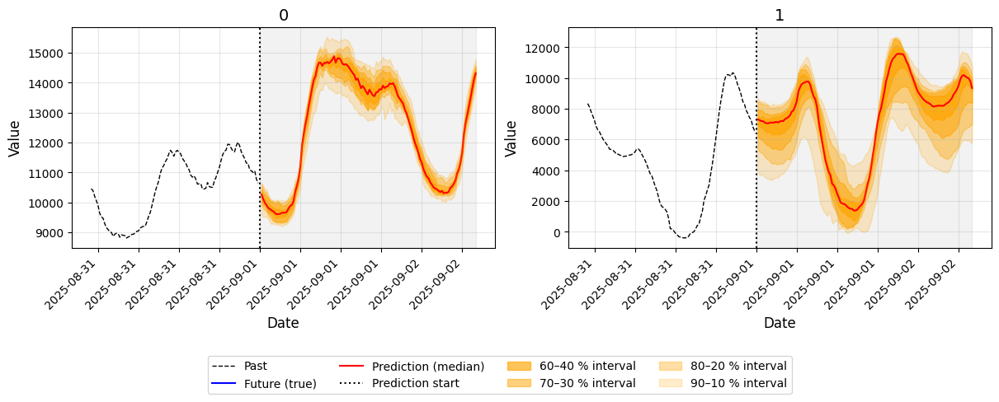

In [108]:
preditions_pp["SeasonalNaive"].plot_forecasts()

In [ ]:
results, info = pipeline.backtest(
    data=data,
    test_start_date=pd.Timestamp("01-01-2023"),
    rolling_window_eval=False,
    train=False,
    val_window_size=None,
    auto_determine_val_set = True,
    train_window_size=None,
    test_window_size=None,
    save_results=True,
    test_window_step=192,
    calibration_based_on="auto",
    calibration_window_step=24,
)

In [ ]:
from src.core.timeseries_evaluation import get_crps_scores

In [73]:
get_crps_scores(results)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorEQC,SeasonalNaive,PostprocessorFastQR
lead times,,,
1,1055.024960,1069.387327,1069.387327
2,1056.734186,1071.285174,1071.285174
3,1052.446603,1067.089444,1067.089444
4,1048.796487,1064.123258,1064.123258
5,1042.926431,1057.904077,1057.904077
...,...,...,...
125,1234.266591,1254.842954,1254.842954
126,1239.041517,1259.539002,1259.539002
127,1237.819709,1258.652227,1258.652227


In [75]:
get_crps_scores(results)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorFastQR,PostprocessorEQC,SeasonalNaive
lead times,,,
1,1048.321127,1054.131514,1069.387327
2,1049.983792,1055.242880,1071.285174
3,1045.792041,1051.376401,1067.089444
4,1042.840835,1048.241594,1064.123258
5,1037.357774,1042.115791,1057.904077
...,...,...,...
125,1226.100799,1231.837179,1254.842954
126,1231.013487,1237.138788,1259.539002
127,1229.855230,1236.317077,1258.652227


In [48]:
get_crps_scores(results)

Compute CRPS (parallel):   0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

,PostprocessorEQC,PostprocessorFastQR,OnlineRandomWalk
lead times,,,
1,167.340847,169.454835,169.454835
2,266.439785,270.471578,270.471580
3,338.963477,353.270723,353.270720
4,410.035422,434.384875,434.384872
5,463.002686,530.182493,530.182489
...,...,...,...
125,2119.794002,2222.456658,2222.456660
126,2193.550839,2316.957051,2316.957051
127,2259.697082,2387.451243,2387.451242


In [ ]:
results, info = pipeline.backtest(
    data=data,
    test_start_date=pd.Timestamp("01-01-2023"),
    rolling_window_eval=False,
    train=False,
    val_window_size=None,
    auto_determine_val_set = True,
    train_window_size=None,
    test_window_size=None,
    save_results=True,
    test_window_step=192,
    calibration_based_on="auto",
    calibration_window_step=24,
)

In [ ]:
# only store the relevant info for each postprocessor/model.

In [ ]:
# for each time series sample 5000 datapoints for which you do the postprocessing.

In [6]:
data_train, data_val, data_test = pipeline.split_time_series_data(data, 
                                                                  test_start_date=pd.Timestamp("01-01-2023"),
                                                                  val_window_size=None,
                                                                  train_window_size=None,
                                                                  test_window_size=None,
                                                                  )

2025-08-18 11:15:03,336 - INFO - pipeline.py - Starting data split operation.
2025-08-18 11:15:03,354 - INFO - pipeline.py - Data split operation completed successfully.


In [3]:
from src.predictors.chronos import BaseTimeSeriesDataset

In [ ]:
data_train, data_val, val_windows = pipeline.auto_split_train_val(data_train, 1, max_val_windows=1)

In [ ]:
data_val

In [132]:
prediction_length=30
train_tail = data_train.slice_by_timestep(start_index=-2048)
data_val = pd.concat([train_tail, data_val], copy=False)
skip_first_n_samples = (train_tail.num_timesteps_per_item() - 1).to_dict()
skip_last_n_samples = {item_id: prediction_length for item_id in data_val.item_ids}

In [104]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": np.arange(1,193), "finetuning_schedule": ["full"], "finetuning_adjust_pretrained_prediction_length": True, "finetuning_warmup_new_neurons": True}, 
                               postprocessors=[PostprocessorEQC, PostprocessorFastQR],
                               #postprocessor_kwargs=[{"n_jobs":1}, {"n_jobs":1, "transformer": None}],
                               freq="B",
                               output_dir=Path("./results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length"))

2025-08-28 23:24:05,219 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/models/Chronos
2025-08-28 23:24:05,220 - INFO - chronos.py - Loading Chronos pipeline from model: amazon/chronos-bolt-tiny
2025-08-28 23:24:05,221 - INFO - chronos.py - Initializing Chronos pipeline with model: amazon/chronos-bolt-tiny
2025-08-28 23:24:06,716 - INFO - chronos.py - Prepended 'new_neurons' for warm-up of new output rows.
2025-08-28 23:24:06,716 - INFO - chronos.py - Final fine-tuning schedule: new_neurons → full
2025-08-28 23:24:06,716 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-08-28 23:24:06,717 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/

In [99]:
mask = pipeline.auto_generate_calibration_config(data, prediction_length=192)

2025-08-28 23:21:41,140 - INFO - <string> - Calibration samples per time series: {0: 384, 1: 384, 2: 384, 3: 384, 4: 384, 5: 384, 6: 384, 7: 384}


In [151]:
preds = pipeline.auto_generate_calibration_forecasts(data_sub, 214)

AttributeError: 'int' object has no attribute 'item_ids'

In [152]:
calibration_preds = pipeline.auto_generate_calibration_forecasts(data_sub, max_calibration_samples=100)

2025-08-29 00:25:27,645 - INFO - <string> - Calibration samples per time series: {0: 93, 1: 93, 2: 93, 3: 93, 4: 93, 5: 93, 6: 93}
2025-08-29 00:25:27,647 - INFO - <string> - Starting forecast generation of model Chronos for data_test from 1990-01-02 00:00:00 to 2025-04-25 00:00:00


Predicting using Chronos:   0%|          | 0/2 [00:00<?, ?it/s]

/Users/louisskowronek/Documents/thesis/master-thesis/chronos-forecasting/src/chronos/chronos_bolt.py:627: UserWarning: We recommend keeping prediction length <= 64. The quality of longer predictions may degrade since the model is not optimized for it. 
  warnings.warn(msg)
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3.12/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.12/3.12.10/Frameworks/Python.framework/Versions/3

In [153]:
fc = calibration_preds["Chronos"].get_time_series_forecast(1)
y_pred, y_true = fc.get_aligned_predictions_and_targets()

In [154]:
fc.forecast_mask

array([False, False, False, ..., False, False, False])

In [157]:
pipeline.train_postprocessors(calibration_preds["Chronos"])

2025-08-29 00:26:54,912 - INFO - pipeline.py - Start training postprocessors...
2025-08-29 00:26:54,913 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorEQC
2025-08-29 00:26:54,913 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/postprocessors/PostprocessorFastQR
Fitting PostprocessorEQC for each time series (item): 100%|██████████| 7/7 [00:00<00:00, 20.80it/s]
2025-08-29 00:26:55,251 - INFO - base.py - Time to fit PostprocessorEQC in seconds: 0.34
Fitting PostprocessorFastQR for each time series (item): 100%|██████████| 7/7 [00:00<00:00, 14.10it/s]
2025-08-29 00:26:55,748 - INFO - base.py - Time to fit PostprocessorFastQR in seconds: 0.5
2025-08-29 00:26:55,749 - INFO - pipeline.py - Postprocessors training completed in 0.836099 seconds.


In [ ]:

result = pipeline.generate_forecasts(data_test=data_sub)
result = pipeline.apply_postprocessors_to_forecasts(result)

{'Chronos': ForecastCollection(item_ids={0: TimeSeriesForecast(item_id=0, lead_time_forecasts={1: HorizonForecast(lead_time=1, predictions=tensor([[0.6656, 0.7545, 0.7997, 0.8263, 0.8490, 0.8739, 0.9150, 1.0136, 1.5096],
         [0.8460, 0.8478, 0.8490, 0.8499, 0.8507, 0.8515, 0.8524, 0.8535, 0.8551],
         [0.8615, 0.8631, 0.8641, 0.8650, 0.8657, 0.8664, 0.8672, 0.8680, 0.8692],
         [0.8598, 0.8613, 0.8622, 0.8630, 0.8636, 0.8642, 0.8649, 0.8656, 0.8666],
         [0.8724, 0.8733, 0.8739, 0.8743, 0.8747, 0.8751, 0.8756, 0.8761, 0.8769],
         [0.8887, 0.8898, 0.8906, 0.8912, 0.8919, 0.8925, 0.8931, 0.8939, 0.8950],
         [0.8324, 0.8343, 0.8355, 0.8366, 0.8376, 0.8386, 0.8398, 0.8412, 0.8433],
         [0.8410, 0.8422, 0.8430, 0.8436, 0.8442, 0.8449, 0.8456, 0.8464, 0.8477],
         [0.7793, 0.7824, 0.7845, 0.7860, 0.7873, 0.7886, 0.7901, 0.7919, 0.7949],
         [0.7890, 0.7909, 0.7921, 0.7931, 0.7940, 0.7949, 0.7958, 0.7969, 0.7985],
         [0.7522, 0.7553, 0.7573

In [29]:
prediction_length = 192

In [19]:
eval_dataset = BaseTimeSeriesDataset(
    data=data,
    context_length=2048,
    window_step=1,
    target_column="target",
    skip_first_n_samples=None,
    skip_last_n_samples=None,
    return_target=True,
    prediction_length=192,
    tokenizer=None,
    rolling=True,
    index_mask=mask,
)

In [7]:
pipeline.train_predictor_model(data_train, val_window_step=8, max_val_windows=5)

2025-08-18 11:15:15,471 - INFO - pipeline.py - Initializing predictor with model: OnlineRandomWalk
2025-08-18 11:15:15,471 - INFO - base.py - Using the following output directory to store results: results/pipeline-test-execution-time-rolling/chronos-zero-shot-prediction_length/models/OnlineRandomWalk
2025-08-18 11:15:15,474 - INFO - pipeline.py - Auto-generating validation data from training data...
2025-08-18 11:15:15,474 - INFO - pipeline.py - Automatically splitting data into training and validation data...
2025-08-18 11:15:15,515 - INFO - pipeline.py - Split result: 560942 timesteps for training (100.0%), 80 timesteps for validation (0.0%)
2025-08-18 11:15:15,516 - INFO - pipeline.py - Split sizes per series: 280471 raw values for training, 40 for validation
2025-08-18 11:15:15,516 - INFO - pipeline.py - Sliding windows: 35058 training windows, 5 validation windows (window size = 8)
2025-08-18 11:15:15,516 - INFO - pipeline.py - Auto-generated validation data with 5 windows
2025-08

In [21]:
calibration_predictions = pipeline.auto_generate_calibration_forecasts(data_train, max_calibration_samples=500)

2025-08-18 14:28:21,681 - INFO - pipeline.py - Automatically determined calibration window_step: 128
2025-08-18 14:28:21,727 - INFO - pipeline.py - Starting forecast generation of model OnlineRandomWalk for data_test from 2021-03-05 08:00:00 to 2022-12-31 23:45:00


Predicting using Random Walk without drift:   0%|          | 0/2 [00:00<?, ?it/s]

2025-08-18 14:28:21,885 - INFO - base.py - OnlineRandomWalk: Time to generate forecasts in seconds: 0.16


skip_first: 216511
data_merged: (280511, 1)
log_targets: (64000,)
log_targets_merged: (280511,)
0
128
256
384
512
640
768
896
1024
1152
1280
1408
1536
1664
1792
1920
2048
2176
2304
2432
2560
2688
2816
2944
3072
3200
3328
3456
3584
3712
3840
3968
4096
4224
4352
4480
4608
4736
4864
4992
5120
5248
5376
5504
5632
5760
5888
6016
6144
6272
6400
6528
6656
6784
6912
7040
7168
7296
7424
7552
7680
7808
7936
8064
8192
8320
8448
8576
8704
8832
8960
9088
9216
9344
9472
9600
9728
9856
9984
10112
10240
10368
10496
10624
10752
10880
11008
11136
11264
11392
11520
11648
11776
11904
12032
12160
12288
12416
12544
12672
12800
12928
13056
13184
13312
13440
13568
13696
13824
13952
14080
14208
14336
14464
14592
14720
14848
14976
15104
15232
15360
15488
15616
15744
15872
16000
16128
16256
16384
16512
16640
16768
16896
17024
17152
17280
17408
17536
17664
17792
17920
18048
18176
18304
18432
18560
18688
18816
18944
19072
19200
19328
19456
19584
19712
19840
19968
20096
20224
20352
20480
20608
20736
20864
20992
211

In [ ]:
pipeline.train_postprocessors(calibration_predictions["Chronos"])

In [ ]:
test_predictions = pipeline.generate_forecasts(data_test, data_train, rolling=True, window_step=24)

In [ ]:
test_predictions = pipeline.apply_postprocessors_to_forecasts(test_predictions)

In [23]:
from src.core.timeseries_evaluation import get_crps_scores, plot_crps_across_lead_times

In [50]:
y_pred, y_true = test_predictions["Chronos"].get_time_series_forecast(1).get_aligned_predictions_and_targets()



In [9]:
data_train

target
item_id timestamp                    
0       2015-01-01 00:15:00  11210.00
        2015-01-01 00:30:00  11118.75
        2015-01-01 00:45:00  11144.75
        2015-01-01 01:00:00  11126.75
        2015-01-01 01:15:00  11009.50
...                               ...
1       2022-12-31 22:45:00   1938.00
        2022-12-31 23:00:00   1781.25
        2022-12-31 23:15:00   1894.75
        2022-12-31 23:30:00   1955.75
        2022-12-31 23:45:00   1926.25

[561022 rows x 1 columns]

In [11]:
from scipy import stats
from tqdm import tqdm

In [ ]:
data_id = calibration_predictions["Chronos"].get_time_series_forecast(0)

# get the preds as (T, H, Q)
y_pred = np.stack([fc.predictions for fc in data_id.lead_time_forecasts.values()]).swapaxes(0,1)

# get the label
y_true = data_id.data["target"].values
y_true = np.roll(y_true, -1)   # move everything one step left
y_true[-1] = np.nan 

T, H, Q = y_pred.shape           # grab sizes
pad = np.full(H - 1, np.nan)     # so late rows can be NaN-padded
y_true_padded = np.concatenate([y_true, pad])
y_true = np.lib.stride_tricks.sliding_window_view(
    y_true_padded, window_shape=H
)

y_true = y_true[data_id.forecast_mask]
residuals = y_true[:, :, None] - y_pred

# describes the offest for each quantile and forecast
offset_matrix = np.empty((H, Q), dtype=residuals.dtype)  # (H, Q)

for i, q in enumerate(data_id.quantiles):
    # residuals[:, h, i] is “time × horizon” slice for the i-th q-level
    offset_matrix[:,i] = np.nanquantile(residuals[:, :, i], q=q, axis=0)

In [ ]:
y_true

In [ ]:
data_id.forecast_mask.shape

In [ ]:
y_true.shape

In [ ]:
data_id.to_dataframe(2)

In [ ]:
offset_matrix

In [208]:
data_id = test_predictions["Chronos"].get_time_series_forecast(0)

# get the preds as (T, H, Q)
y_pred = np.stack([fc.predictions for fc in data_id.lead_time_forecasts.values()]).swapaxes(0,1)


In [209]:
preds_adj = y_pred + offset_matrix

In [ ]:
preds_adj.shape

In [211]:
timeseriesforecast = data_id.model_copy(deep=True)
for h, fc in timeseriesforecast.lead_time_forecasts.items():
    fc.predictions = preds_adj[:,h-1,:]

In [ ]:
data_id.get_crps(1)

In [ ]:
timeseriesforecast.get_crps(1)

In [ ]:
690 / 697

In [138]:
offsets = {
    h: {float(q): offset_matrix[i, h] for i, q in enumerate(data_id.quantiles)}
    for h in range(offset_matrix.shape[1])
}

In [95]:
df = data_id.to_dataframe(1).dropna().copy()


In [ ]:
offsets

In [ ]:
valid_mask

In [ ]:
y_true[valid_mask]

In [ ]:
df

In [ ]:
np.quantile(df["target"] - df[0.1], 0.1)

In [ ]:
offsets

In [ ]:
# next: add a general config and a specific config. -- done
# why are no models saved?
# backtest with rolling window. -> add total execution time.
# backtest with rolling window -> allow to save predictions.joblib individual runs and aggregated.

In [ ]:
results, info = pipeline.backtest(
    data=data.loc[[0]],
    test_start_date=pd.Timestamp("01-01-2022"),
    rolling_window_eval=True,
    train=True,
    val_window_size=pd.DateOffset(years=1),
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
    test_window_step=192
)

In [ ]:
results, info = pipeline.backtest(
    data=data.loc[[0]],
    test_start_date=pd.Timestamp("01-01-2022"),
    rolling_window_eval=True,
    train=True,
    val_window_size=pd.DateOffset(years=1),
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
    test_window_step=192
)

In [ ]:
results, info = pipeline.backtest(
    data=data.loc[[0]],
    test_start_date=pd.Timestamp("01-01-2022"),
    rolling_window_eval=True,
    train=True,
    val_window_size=pd.DateOffset(years=1),
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [31]:
for bt, info_bt in info.items():
    break

In [ ]:
def _combine_execution_time(self, execution_time_dicts: list[dict]) -> dict:
    """
    Aggregate a list of execution_time dicts (from multiple backtests) into one.
    """
    merged = {"predictor": {}, "postprocessors": {}}
    by_pred_name = {}
    by_pp_name = {}

    for d in execution_time_dicts:
        for pname, pobj in d["predictor"].items():
            by_pred_name.setdefault(pname, []).append(pobj)
        for ppname, ppobj in d["postprocessors"].items():
            by_pp_name.setdefault(ppname, []).append(ppobj)

    merged["predictor"] = {pname: aggregate_execution_time_objects(objs) for pname, objs in by_pred_name.items()}
    merged["postprocessors"] = {ppname: aggregate_execution_time_objects(objs) for ppname, objs in by_pp_name.items()}

    return merged

In [ ]:
aggregate_execution_time_objects(all_pred_obj)

In [ ]:
all_pred_obj[0]

In [ ]:
per_window_fc = [backtest_results[d][predictor_name] for d in k]


In [ ]:
# different approach: 
# define a function to merge multiple executiontimepredictor and executiontimepostprocessor

# iterate over backtest dict and find the relevant bits. put it in the function

In [ ]:
tr, val, test = pipeline.split_time_series_data(data, pd.Timestamp("06-06-2025"),None, pd.DateOffset(years=1), None)

In [ ]:
result = pipeline.generate_forecasts(test)

In [ ]:
result["Chronos"].get_time_series_forecast(1).to_dataframe(127)

In [ ]:
result["Chronos"].get_time_series_forecast(1).to_dataframe(192)

In [ ]:
result["Chronos"].get_time_series_forecast(1).to_dataframe(127)

In [ ]:
result["Chronos"].get_time_series_forecast(1).to_dataframe(192)

In [ ]:
data_train, data_test = data.split_by_time(pd.Timestamp(year=2022, month=12, day=31, hour=23, minute=59))

In [19]:
data_train, data_test = data.split_by_time(pd.Timestamp(year=2022, month=12, day=31, hour=23, minute=59))

In [ ]:
data_test

In [ ]:
results2 = pipeline.backtest(
    data=data,
    test_start_date=pd.Timestamp("01-01-2020"),
    rolling_window_eval=True,
    train=False,
    val_window_size=pd.DateOffset(years=1),
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
    stride=1
)

In [ ]:
results2 = pipeline.backtest(
    data=data,
    test_start_date=pd.Timestamp("01-01-2020"),
    rolling_window_eval=False,
    train=False,
    val_window_size=pd.DateOffset(years=1),
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [ ]:
data_train, data_val, data_test = pipeline.split_time_series_data(data,
                                                                  test_start_date=pd.Timestamp("01-01-2020"),
                                                                  val_window_size=pd.DateOffset(years=1),
                                                                  train_window_size=None,
                                                                  test_window_size=None,)

In [ ]:
predictions_test_data = pipeline.generate_forecasts(
            data_test=data_test,
            data_previous_context=data.split_by_time(data_test.index.get_level_values("timestamp").min())[0],
            rolling=True,
            stride=1,
        )

In [ ]:
predictions_calibration_data = pipeline.generate_forecasts(
    data_test=data_val,
    data_previous_context=data_train,
    rolling=True,
    stride=1,
)

In [ ]:
predictions_calibration_data["Chronos"].get_time_series_forecast(6).to_dataframe(14)

In [ ]:
postprocessed = pipeline.train_postprocessors(predictions_calibration_data[pipeline.predictor.__class__.__name__])


In [ ]:
# today: fix results

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=RollingSeasonalQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq, "last_n_samples": 20}, 
                               # postprocessors=[PostprocessorQR, PostprocessorEQC],
                               freq="15 min",
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-prediction_length"))

In [22]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=RandomWalkBenchmark, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times}, 
                               # postprocessors=[PostprocessorQR, PostprocessorEQC],
                               freq="B",
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-prediction_length"))

In [6]:
data_train, data_test = data.split_by_time(pd.Timestamp("01-01-2025"))
data_train, data_val = data_train.split_by_time(pd.Timestamp("06-01-2024"))
_, data_train = data_train.split_by_time(pd.Timestamp("01-01-2024"))

In [7]:
from autogluon.timeseries import TimeSeriesPredictor

In [ ]:
predictor = TimeSeriesPredictor(
    prediction_length=5,        # How many time steps ahead to forecast
    freq="B",                  # Frequency of the data
    verbosity=4,
)

predictor.fit(
    train_data=data_train,
    hyperparameters={"AutoARIMA": {}},
)

# ----------------------------
# Generate forecasts
# ----------------------------
# You can forecast for *any* known item_id
# forecasts = predictor.predict(data_test)


In [ ]:
forecasts = predictor.predict(data_test)


In [ ]:
forecasts.columns

In [ ]:
predictor.plot(data_test, forecasts, max_history_length=300)

In [70]:
from src.predictors.chronos import BaseTimeSeriesDataset
from torch.utils.data import DataLoader
from gluonts.dataset.common import ListDataset
from tqdm import tqdm
import torch
from src.core.timeseries_evaluation import HorizonForecast, ForecastCollection, TimeSeriesForecast
from typing import Dict

In [ ]:
data

In [188]:
ds = BaseTimeSeriesDataset(data, 2048, window_step=1, rolling=True, return_target=True, prediction_length=64)
dl = DataLoader(ds, batch_size=512, num_workers=4)


In [ ]:
# get old code. run old code. check if it has a time improvement. if yes, try to improve it.

In [ ]:
import time
start = time.time()
for i in ds:
    None
print("Time per sample:", time.time() - start)

In [ ]:
import time
start = time.time()
for i in ds:
    None
print("Time per sample:", time.time() - start)


In [ ]:
ds[1000]

In [ ]:
ds[1000]

In [ ]:

for batch in dl: 
    break

In [ ]:
batch.shape

In [6]:
from src.predictors.autogluon_wrapper import AutogluonPredictor, PatchTST_Ag, TiDE_Ag, Chronos_Ag, SeasonalNaive_Ag

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=AutogluonPredictor, 
                               model_kwargs={"lead_times": lead_times, 
                                             "freq": "15 min",
                                             "predictor_kwargs": {}, 
                                             "fit_kwargs": {"hyperparameters": {"AutoARIMA": {}}},
                                             "predict_kwargs": {},
                                             "context_length": 512,
                                             },
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               freq="15 min",
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-prediction_length"))

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=SeasonalNaive_Ag, 
                               model_kwargs={"lead_times":lead_times, "freq": "B", "seasonal_period": 5}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               freq="B",
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-prediction_length"))

In [ ]:
4*24*7

In [ ]:
pipeline.train_predictor_model(data_train)

In [ ]:
predictions_cal = pipeline.generate_forecasts(data_val, data_train, rolling=False, stride=24)

In [ ]:
pipeline.train_postprocessors(predictions_cal["Chronos"])

In [ ]:
predictions2 = pipeline.generate_forecasts(data_test, data_val, rolling=False, stride=1000)

In [ ]:
predictions_calibrated = pipeline.apply_postprocessors_to_forecasts(predictions)

In [ ]:
predictions2["AutogluonPredictor"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
predictions2["AutogluonPredictor"].get_time_series_forecast(0).plot_forecasts(200)

In [ ]:
predictions2["RandomWalkBenchmark"].get_time_series_forecast(0).plot_forecasts(200)

In [ ]:
predictions2["Chronos"].get_time_series_forecast(0).plot_forecasts(200)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(0).plot_forecasts(200)

In [ ]:
predictions["SeasonalNaive_Ag"].get_time_series_forecast(0).plot_forecasts(200)

In [ ]:
predictions["SeasonalNaive_Ag"].get_time_series_forecast(0).get_reliability_diagram(1)

In [ ]:
get_crps_scores(predictions, item_ids=[0])

In [ ]:
predictions["SeasonalNaive_Ag"].get_crps()

In [ ]:
predictions["PostprocessorQR"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["ChronosAg"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["ChronosAg"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["TiDE"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["PatchTST"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
predictions["AutogluonPredictor"].get_time_series_forecast(1).plot_forecasts(100)

In [ ]:
from autogluon.timeseries.models import SeasonalNaiveModel

# 3. Instantiate the model
model = SeasonalNaiveModel(
    prediction_length=192,
    hyperparameters={"seasonal_period": 672}
)

# 4. Fit the model
model.fit(data_train)

In [ ]:
4*24*7

In [57]:
data_sub = data_test.slice_by_timestep(start_index=0, end_index=10)

In [ ]:
data_sub

In [61]:
# 5. Predict
forecasts = model.predict(data_test)


In [23]:
quantile_names = [str(q) for q in quantiles]
forecasts_array = np.stack([group[quantile_names].values.T for sample, group in forecasts.groupby(level=0)])

In [ ]:
ds.to_forecast_collection(predictions=torch.tensor(forecasts_array), lead_times=lead_times, output_data=output_data, freq=freq)

In [ ]:
# convert a single time series dataframe into a ForecastCollection object

In [29]:
import matplotlib.pyplot as plt

In [ ]:
plt.plot(forecasts.loc[1].values)

In [ ]:
plt.plot(forecasts.loc[1].values)

In [ ]:
plt.plot(forecasts.loc[1].values)

In [ ]:
forecasts

In [ ]:
predictions["AutogluonPredictor"].get_time_series_forecast(0).to_dataframe(1)


In [ ]:
predictions["TiDE"].get_crps()

In [ ]:
predictions["PatchTST"].get_crps()

In [ ]:
predictions["AutogluonPredictor"].get_crps()

In [ ]:
predictions["AutogluonPredictor"].get_crps()

In [ ]:
predictions["Chronos"].get_crps()

In [ ]:
predictions["Chronos"].get_crps()

In [ ]:
predictions["ChronosAg"].get_crps()

In [ ]:
get_crps_scores(preds)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-prediction_length"))

In [ ]:
pipeline.train_predictor_model(data_train, data_val)

In [10]:
data_sub = data_test.iloc[:1000]

In [ ]:
predictions = pipeline.generate_forecasts(data_sub, rolling=True, stride=2)

In [ ]:
ds = ChronosBacktestingDataset(data_train, 2048, stride=1, rolling=True)

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).to_dataframe(1)

In [ ]:
predictions["Chronos"].get_crps(mean_item_ids=True, mean_lead_times=False)

In [ ]:
data_sub

In [ ]:
pd.Timedelta(data_sub.freq)

In [30]:
fc_collection = ds.to_forecast_collection(predictions["Chronos"][0], lead_times, predictions["Chronos"][1], freq)

In [ ]:
fc_collection.get_time_series_forecast(0).plot_forecasts()

In [ ]:
predictions["Chronos"][0].shape

In [ ]:
predictions["Chronos"][1]

In [ ]:
predictions2["Chronos"].get_crps()

In [267]:
predictions3["Chronos-zero-shot"] = predictions3.pop("Chronos")

In [268]:
predictions.update(predictions3)

In [ ]:
predictions["AutogluonPredictor"].get_crps()

In [262]:
from src.core.timeseries_evaluation import plot_crps_across_lead_times, get_crps_scores

In [ ]:
plot_crps_across_lead_times(predictions)

In [ ]:
get_crps_scores(predictions, reference_predictions="AutogluonPredictor")

In [ ]:
forecasts = predictor.predict(data_test)


In [ ]:
forecasts

In [56]:
from gluonts.torch.model.patch_tst import PatchTSTEstimator
from gluonts.torch.distributions import QuantileOutput


estimator = PatchTSTEstimator(
    prediction_length=192,
    context_length=512,  # optionally 10×pred_len
    patch_len=16,
    # stride=8,
    # num_encoder_layers=3,
    # d_model=128,
    # dim_feedforward=256,
    # nhead=16,
    # dropout=0.2,
    # lr=0.0001,
    # trainer_kwargs={'max_epochs': 20},
)

In [ ]:

def tsdf_to_listdataset(ts_df: TimeSeriesDataFrame, freq: str):
    """
    Converts a TimesSeriesDataFrame to a ListDataset compatible with GluonTS
    """
    def one_series(item_id):
        y = ts_df.loc[item_id]["target"]

        return {
            "item_id": item_id,
            "target": y.to_numpy().astype("float32"),
            "start": y.index[0],
            "feat_static_cat": [item_id],
        }

    return ListDataset(
        [one_series(i) for i in ts_df.item_ids],
        freq = freq,
    )

# freq = "15 min"
train_ds   = tsdf_to_listdataset(data_train.loc[[0]], freq)
val_ds   = tsdf_to_listdataset(data_val.loc[[0]], freq)

In [62]:
from autogluon.timeseries.models.gluonts.abstract_gluonts import SimpleGluonTSDataset

In [63]:
ds = SimpleGluonTSDataset(data_train, freq)

In [66]:
for i in ds:
    break

In [ ]:
predictor = estimator.train(train_ds, val_ds)

In [ ]:
# use a custom dataset/dataloader
# iterate over batches in dataloader 
# currently i only have a temporary solution for the format
# convert each batch in the correct format
# save results in the correct format
# build an autogluon wrapper

In [177]:
from src.predictors.chronos import BaseTimeSeriesDataset
from torch.utils.data import DataLoader

In [ ]:
ds = BaseTimeSeriesDataset(data_test, 2048, stride=10)
dl = DataLoader(ds, shuffle=False, batch_size=128)

In [ ]:
ds.timestamps[1].timestamp()

In [288]:
# vectorised look-ups instead of the old nested loops
preds_df = pd.DataFrame(
    {
        "item_id": ds.valid_item_ids,
        "timestamp": ds.valid_timestamps,
    },

)

In [ ]:
preds_df

In [ ]:
preds_df = pd.DataFrame(
    {
        "item_id": self.valid_item_ids,
        "timestamp": self.valid_timestamps,
    },
    index=pd.RangeIndex(len(predictions)),
)

In [90]:
from tqdm import tqdm

In [ ]:
forecasts_all = []

for batch in tqdm(dl):
    
    gluonts_batch = ListDataset([{"item_id": item_id, "target": target, "start": pd.to_datetime(start.item(), unit="s", utc=True), "feat_static_cat": [item_id]} for (item_id, target, start) in zip(batch["item_id"], batch["target"], batch["start"])], 
                    freq=freq)

    forecasts = predictor.predict(gluonts_batch)

    forecasts_all.extend(list(forecasts))


In [ ]:
def _stack_distribution_forecasts(self, forecasts: List[Forecast], item_ids: pd.Index) -> pd.DataFrame:
    import torch
    from gluonts.torch.distributions import AffineTransformed
    from torch.distributions import Distribution

    # Sort forecasts in the same order as in the dataset
    item_id_to_forecast = {str(f.item_id): f for f in forecasts}
    forecasts = [item_id_to_forecast[str(item_id)] for item_id in item_ids]

    def stack_distributions(distributions: List[Distribution]) -> Distribution:
        """Stack multiple torch.Distribution objects into a single distribution"""
        params_per_dist = []
        for dist in distributions:
            params = {name: getattr(dist, name) for name in dist.arg_constraints.keys()}
            params_per_dist.append(params)
        # Make sure that all distributions have same keys
        assert len(set(tuple(p.keys()) for p in params_per_dist)) == 1

        stacked_params = {}
        for key in dist.arg_constraints.keys():
            stacked_params[key] = torch.cat([p[key] for p in params_per_dist])
        return dist.__class__(**stacked_params)

    if not isinstance(forecasts[0].distribution, AffineTransformed):
        raise AssertionError("Expected forecast.distribution to be an instance of AffineTransformed")

    # We stack all forecast distribution into a single Distribution object.
    # This dramatically speeds up the quantiles calculation.
    stacked_base_dist = stack_distributions([f.distribution.base_dist for f in forecasts])

    stacked_loc = torch.cat([f.distribution.loc for f in forecasts])
    if stacked_loc.shape != stacked_base_dist.batch_shape:
        stacked_loc = stacked_loc.repeat_interleave(self.prediction_length)

    stacked_scale = torch.cat([f.distribution.scale for f in forecasts])
    if stacked_scale.shape != stacked_base_dist.batch_shape:
        stacked_scale = stacked_scale.repeat_interleave(self.prediction_length)

    stacked_dist = AffineTransformed(stacked_base_dist, loc=stacked_loc, scale=stacked_scale)

    mean_prediction = stacked_dist.mean.cpu().detach().numpy()
    quantiles = torch.tensor(self.quantile_levels, device=stacked_dist.mean.device).reshape(-1, 1)
    quantile_predictions = stacked_dist.icdf(quantiles).cpu().detach().numpy()
    forecast_array = np.vstack([mean_prediction, quantile_predictions]).T
    return pd.DataFrame(forecast_array, columns=["mean"] + [str(q) for q in self.quantile_levels])


In [ ]:
# num_samples x prediction length x num_quantiles

In [ ]:
forecasts_all[3].quantile(0.5)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

item_id_to_show = data_test.item_ids[0]
series_history  = data_test.loc[item_id_to_show]["target"]

fcst = i

fig, ax = plt.subplots(figsize=(12, 4))
#ax.plot(series_history[-1000:])
fcst.plot(intervals=[0.5, 0.9], ax=ax)   # mean + 50% & 90% PIs
ax.set_title(f"Item {item_id_to_show}")
ax.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

item_id_to_show = data_test.item_ids[0]
series_history  = data_test.loc[item_id_to_show]["target"]

fcst = i

fig, ax = plt.subplots(figsize=(12, 4))
#ax.plot(series_history[-1000:])
fcst.plot(intervals=[0.5, 0.9], ax=ax)   # mean + 50% & 90% PIs
ax.set_title(f"Item {item_id_to_show}")
ax.legend()
plt.show()

In [ ]:
predictor.plot(data_test, forecasts, quantile_levels=[0.1, 0.9], max_history_length=200, max_num_item_ids=4);

In [ ]:
forecasts

In [ ]:
predictions["Chronos"].get_time_series_forecast(44).to_dataframe(13)

In [ ]:
pipeline.train_predictor_model(data_train)

In [ ]:
predictions = pipeline.generate_forecasts(data_test, data_train, stride=1, rolling=False)

In [ ]:
predictions["Chronos"].item_ids[2].plot_forecasts(context_length=100)

In [ ]:
predictions["Chronos"].get_reliability_diagram([1,2,6,12,64,65,192])

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].item_ids[0].plot_forecasts(600, context_length=100)

In [ ]:
predictions = pipeline.generate_forecasts(data_test, data_train, stride=1, rolling=True)

In [ ]:
predictions["RollingQuantilePredictor"].get_time_series_forecast(1).get_crps(2)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_crps(mean_lead_times=True)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_crps(mean_lead_times=True)

In [ ]:
predictions = pipeline.generate_forecasts(data_train, stride=2, rolling=True)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].queue

In [ ]:
predictions["RollingQuantilePredictor"].get_time_series_forecast(0).plot_forecasts(1000, context_length=300)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts(start=1000, context_length=200)

In [ ]:
predictions_c["Chronos"].get_crps()

In [ ]:
predictions["Chronos"].get_crps()

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_crps()

In [ ]:
predictions2["RollingSeasonalQuantilePredictor"].get_crps()

In [ ]:
predictions["Chronos"].get_crps(mean_lead_times=True)

In [ ]:
predictions_c["Chronos"].get_crps(mean_lead_times=True)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_crps(mean_lead_times=True)

In [ ]:
# tomorrow: adapt code that the benchmarks work with the new code.

In [ ]:
# now i need to fix the to_dataframe()
# then backtesting with stride should work correctly
# potential improvement: backtest with specific day and hour
# then update the other models to work with that

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=9000, context_length=200)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=1000, context_length=200)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=-100, context_length=200)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=-1, context_length=100)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=1222, context_length=100)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=1222, context_length=100)

In [ ]:
preds = predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(start=1222, context_length=100)

In [ ]:
preds.get_indexer([pd.Timestamp("01-02-2025")])

In [ ]:
# based on the start idx i need to find the actual idx in the masked series.

In [ ]:
preds.shape

In [93]:
forecast_mask = predictions["Chronos"].get_time_series_forecast(1).forecast_mask

In [98]:
lead_times_c = predictions["Chronos"].get_time_series_forecast(1).get_lead_times()

In [ ]:
lead_times_c + start_idx

In [ ]:
timestamps[forecast_mask]

In [ ]:
len(timestamps)

In [ ]:
preds

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).get_lead_time_forecast(2).predictions.shape

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).plot_forecasts(context_length=2)

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).data

In [ ]:
# next: make to_dataframe() work again. 
# make the option if rolling = False work.

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).get_lead_time_forecast(1).predictions[10:12,...]

In [214]:
predicted_idxs = predictions["Chronos"][1]

In [212]:
output_data = predictions["Chronos"][0]

In [218]:
predicted_mi = output_data.iloc[predicted_idxs].index

In [ ]:
predicted_mi

In [ ]:
predictions["Chronos"][0].shape

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).predicted_indices

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).plot_forecasts()

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).predicted_indices

In [ ]:
# we need to know which idxs belong to which item id.



In [ ]:
predictions["Chronos"][1][np.array([1,2,3]),...].shape

In [ ]:
predictions["Chronos"][0].valid_idx.shape

In [ ]:
data

In [ ]:
predictions["Chronos"][0].valid_idx_per_item_id[0]

In [ ]:
predictions["Chronos"].valid_idx

In [ ]:
predictions["Chronos"][0]

In [ ]:
data_test.loc[1]

In [ ]:
predictions["Chronos"][1].loc[1]

In [ ]:
predictions["Chronos"][0].valid_idx

In [ ]:
np.full(20, False)

In [ ]:
predictions["Chronos"][0] & predictions["Chronos"][1]

In [ ]:
predictions["Chronos"][1]

In [ ]:
# i need to get the info on the actually predicted values

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).data

In [ ]:
predictions["Chronos"].get_time_series_forecast(1).plot_forecasts()

In [ ]:
predictions = pipeline.generate_forecasts(data_test, data_train, rolling=True, stride=12)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).to_dataframe(1)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).data

In [ ]:
# with stride i still need to save the full dataframe and an index indicating the values that i predicted. 

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts(start=10,context_length=0)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts()

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts(2500, context_length=200)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts(2500, context_length=200)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_time_series_forecast(1).plot_forecasts(2500, context_length=200)

In [ ]:
predictions["RollingSeasonalQuantilePredictor"].get_crps()

In [ ]:
# lassen sich die modelle in autogluon laden?

In [ ]:
result = pipeline.generate_forecasts(data_test)

In [ ]:
result

In [ ]:
result["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
result["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
result["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
pipeline.predictor.pipeline.inner_model

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot-2-prediction_length"))

In [98]:
data_train = data.iloc[:100]

In [ ]:
pipeline.train_predictor(data_train)

In [ ]:
pipeline.train_predictor(data_train)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-t5-base", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-mini", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

In [80]:
data_test = data.iloc[:4000].copy()

In [ ]:
# influence of prediction length

In [ ]:
# resized head to 192 and last layer tuning
postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC]
postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": None, "n_jobs": 4}, {"n_jobs": 4}]
test_start_date = pd.Timestamp("2023-01-01")
val_window_size = pd.DateOffset(years=5)             

# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=postprocessors,
                               postprocessor_kwargs=postprocessor_kwargs,
                               output_dir=Path("./results/pipeline-test/chronos-bolt-last-layer-etended-prediction_length"))

results = pipeline.backtest(
    data=data,
    test_start_date=test_start_date,
    rolling_window_eval=False,
    train=True,
    val_window_size=val_window_size,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [ ]:
# no training and keep dimensions the same
postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC]
postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": None, "n_jobs": 4}, {"n_jobs": 4}]
test_start_date = pd.Timestamp("2023-01-01")
val_window_size = pd.DateOffset(years=5)             

# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=postprocessors,
                               postprocessor_kwargs=postprocessor_kwargs,
                               output_dir=Path("./results/pipeline-test/chronos-bolt-zero-original-prediction_length"))

results2 = pipeline.backtest(
    data=data,
    test_start_date=test_start_date,
    rolling_window_eval=False,
    train=False,
    val_window_size=val_window_size,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [ ]:
data, mapping, freq = read_smard_data(
    file_paths=[
        "data/electricity_consumption/Actual_consumption_201501010000_202001010000_Quarterhour.csv",
        "data/electricity_consumption/Actual_consumption_202001010000_202506120000_Quarterhour.csv",
    ],
    selected_time_series=["grid load [MWh] Original resolutions", "Residual load [MWh] Original resolutions"],
    freq=pd.Timedelta("15 min"),
)
lead_times = np.arange(1, 192+1).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()

In [ ]:
# next: only train the new weights.

# after early stopping is hit for new output neurons, we retrain the full network.

# add data augmentation to pipeline.

In [ ]:
# add a new variable which states: finetune new output neurons first. This should work with all model_inits.

In [ ]:
postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC]
postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": None, "n_jobs": 4}, {"n_jobs": 4}]
test_start_date = pd.Timestamp("2025-01-01")
val_window_size = pd.DateOffset(months=6)             

pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-t5-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_adjust_pretrained_prediction_length": False}, 
                               postprocessors=postprocessors,
                               postprocessor_kwargs=postprocessor_kwargs,
                               output_dir=Path("./results/pipeline-final-head/chronos-bolt-zero-original-prediction_length-2"))

In [ ]:
predictions = pipeline.predict(data.iloc[:100])

In [ ]:
predictions = pipeline.predict(data.iloc[:100])

In [ ]:
predictions = pipeline.predict(data.iloc[:100])

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).plot_forecasts()

In [ ]:
postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC]
postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": None, "n_jobs": 4}, {"n_jobs": 4}]
test_start_date = pd.Timestamp("2025-01-01")
val_window_size = pd.DateOffset(months=6)             

pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "results/pipeline-final-head/chronos-bolt-zero-original-prediction_length/models/warmup-new-neurons/fine-tuned-ckpt", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=postprocessors,
                               postprocessor_kwargs=postprocessor_kwargs,
                               output_dir=Path("./results/pipeline-final-head/chronos-bolt-zero-original-prediction_length"))

results2 = pipeline.backtest(
    data=data.iloc[-50000:],
    test_start_date=test_start_date,
    rolling_window_eval=False,
    train=False,
    val_window_size=val_window_size,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [ ]:
# zero shot forecasting with autoregressive decoding
results1[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results1[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with zero shot forecasting
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with last layer fine tuning
results3[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results3[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with new output neuron fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with new output neuron fine tuning and then full fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with new output neuron fine tuning and then last layer fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with new output neuron fine tuning (1 epoch) and then full layer fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
# extended head with new output neuron fine tuning (3 epoch and lr 1e-3) and then full layer fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(2000)

In [ ]:
# extended head with new output neuron fine tuning (3 epoch and lr 1e-3) and then full layer fine tuning
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
# zero shot forecasting with autoregressive decoding
get_crps_scores(results1[0])

In [ ]:
# extended head with zero shot forecasting
get_crps_scores(results2[0])

In [ ]:
# extended head with last layer fine tuning
get_crps_scores(results2[0])

In [ ]:
# extended head with new output neuron fine tuning
get_crps_scores(results2[0])

In [ ]:
# extended head with new output neuron fine tuning and then full fine tuning
get_crps_scores(results2[0])

In [ ]:
# extended head with new output neuron fine tuning and then last layer fine tuning
get_crps_scores(results2[0])

In [ ]:
# extended head with new output neuron fine tuning and then last layer fine tuning
get_crps_scores(results2[0])

In [ ]:
# extended head with new output neuron fine tuning (1e-3) and then full fine tuning 
get_crps_scores(results2[0])

In [ ]:
data, mapping, freq = read_exchange_rates_data(files_dir="data/exchange_rates/")
lead_times = np.arange(1, 192+1).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()

In [ ]:
postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC]
postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": None, "n_jobs": 4}, {"n_jobs": 4}]
test_start_date = pd.Timestamp("2023-01-01")
val_window_size = pd.DateOffset(years=5)             

pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_adjust_pretrained_prediction_length": True}, 
                               postprocessors=postprocessors,
                               postprocessor_kwargs=postprocessor_kwargs,
                               output_dir=Path("./results/pipeline-test/chronos-bolt-zero-extended-prediction_length"))

results1 = pipeline.backtest(
    data=data,
    test_start_date=test_start_date,
    rolling_window_eval=False,
    train=False,
    val_window_size=val_window_size,
    train_window_size=None,
    test_window_size=None,
    calibration_based_on="val",
    save_results=True,
)

In [ ]:
# zero shot forecasting with autoregressive decoding
results1[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
# extended head with zero shot forecasting
results2[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [ ]:
# extended head with last layer fine tuning
results3[0]["Chronos"].get_time_series_forecast(1).plot_forecasts(1000)

In [168]:
from src.core.timeseries_evaluation import load_predictions, get_crps_scores

In [ ]:
# zero shot forecasting with autoregressive decoding
get_crps_scores(results1[0])

In [ ]:
# extended head with zero shot forecasting
get_crps_scores(results2[0])

In [ ]:
# extended head with last layer fine tuning
get_crps_scores(results3[0])

In [ ]:
# next: allow to specify different data sets, think about how to combine the results. 
# -> fine tune individual time series, fine tune domain, fine tune full. 
# But for that i need to be able to specify multiple timeseriesdataframes
# since the "resolution" differs
# can i fine tune on different resolutions?
# i could input a list of TimeSeriesDataFrames for each step or a dict of TimeSeriesDataFrames.
# 
# {"energy": TimeSeriesDataFrame, "Großhandelspreise": TimeSeriesDataFrame, "exchange_rates": TimeSeriesDataFrame}
# postprocessor always on indivual time series -> as soon as you have different scales, e.g. exchange rates, the postprocessing does not make sense anymore. Or first normalize, and then do postprocessing
# training on three options: joint, domain, individual
# in my prediction results I can just append them to the prediction collection, since they are "independent". 
# For each TimeSeriesForecast define a domain name. -> get the domain name from the time series input. Maybe we do not want to input only a TimeSeriesDataFrame

#  Then basically handling in the pipeline whether to combine them or not
# do i need to expand timeseries dataframe to support different resolutions? 
# or should i store each time series in a separate timeseriesdataframe?
# or add a domain for each id in a timeseries dataframe and then specify the frequency for each domain and item id in a separate dict that is added to the timeseriesdataframe

In [ ]:
# make the evaluation more efficient by only evaluating on a subset of the data. otherwise it takes forever
## i need the calibration data, so it still should be kind of a big portion, like e.g. 5 years

In [ ]:
predictions["Chronos"].item_ids[0].plot_forecasts(57)

In [ ]:
predictions["Chronos"].item_ids[0].plot_forecasts(30)

In [ ]:
predictions["Chronos-bolt-finetuned"].get_time_series_forecast(0).plot_forecasts(23)

In [ ]:
predictions["Chronos-bolt"].get_time_series_forecast(0).plot_forecasts(23)

In [ ]:
predictions["Chronos"].get_time_series_forecast(0).plot_forecasts(23)

# Predictions

In [4]:
from src.postprocessors.mle import PostprocessorMLE
from src.postprocessors.qr import PostprocessorQR
from src.postprocessors.gb import PostprocessorGB
from src.postprocessors.eqc import PostprocessorEQC
from src.predictors.quantile_regression import QuantileRegression
from src.pipeline.pipeline import ForecastingPipeline
from src.predictors.chronos import Chronos
from src.predictors.benchmarks import RollingQuantilePredictor

In [5]:
lead_times = np.arange(1, 64*3+1).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()

In [6]:
print(lead_times)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]


## Minimum working example

In [ ]:
pipeline = ForecastingPipeline(model=RollingQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE],
                               output_dir="./results/pipeline/rolling_benchmak")

data_train, data_val, data_test = pipeline.split_data(data=data, 
                                                      test_start_date=pd.Timestamp("01-01-2022"), 
                                                      train_window_size=None,
                                                      test_window_size=None,
                                                      val_window_size=None)

pipeline.train(data_train)
pipeline.train_postprocessors(calibration_data=data_train)

predictions = pipeline.predict(data_test=data_test, data_previous_context=data_train)
predictions = pipeline.apply_postprocessing(predictions)

pipeline.save()
pipe = ForecastingPipeline.from_pretrained(path="./results/pipeline/nearest_neighbour")

# Backtest (16-05-2025)

In [ ]:
# currently use all data for postprocessing
# i need to set the seed somewhere for the whole project
# that means predict would need to get an additional parameter: sample
# test: use only a subset of the data for postprocessing, like e.g. 10%


In [ ]:
#add transformation option to postprocessor. 

In [ ]:
# add postprocessor kwargs
# allow to specify different transformations with postprocessors
# add postprocessor kwargs to output path
# store execution time for each postprocessor

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-t5-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))


In [ ]:
results = pipeline.predict(data)

In [ ]:
results["Chronos"].item_ids[0].plot_forecasts()

In [ ]:
results["Chronos"].item_ids[0].plot_forecasts()

In [ ]:

data_train, data_val, data_test = pipeline.split_data(data, pd.Timestamp("01-01-2023"), None, None, None)

test_predictions = pipeline.predictor.predict(data_test, data_train)

calibration_predictions = pipeline.predictor.predict(data_train, None)

In [ ]:
# arcsinh for x and y
pp2 = PostprocessorQR()
pp2.fit(data=calibration_predictions, n_jobs=1)

In [ ]:
postprocessed_predictions_gb2 = pp2.postprocess(data=test_predictions)

In [ ]:
postprocessed_predictions_gb = pp.postprocess(data=test_predictions)

In [ ]:
get_crps_scores({"GB": postprocessed_predictions_gb, "GB_reduced": postprocessed_predictions_gb2, "Chronos": test_predictions}, reference_predictions="Chronos")

In [ ]:
d.plot()

In [ ]:
# arcsinh for x and y
pp = PostprocessorMLE(transformer="yeo-johnson")
pp.fit(data=calibration_predictions, n_jobs=1)

In [ ]:
postprocessed_predictions_yj = pp.postprocess(data=test_predictions)

In [ ]:
# MLE arcsin transformation -> schlecht
# MLE unprocessed transformation -> schlecht
# MLE log mit 100_000 kostante transformation -> gut

In [ ]:
postprocessed_predictions = pp.postprocess(data=test_predictions)

In [ ]:
# no transformation
pp2 = PostprocessorQR()
pp2.fit(data=calibration_predictions)

postprocessed_predictions2 = pp2.postprocess(data=test_predictions)

In [ ]:
# arcsinh only for x
pp3 = PostprocessorQR()
pp3.fit(data=calibration_predictions)

postprocessed_predictions3 = pp3.postprocess(data=test_predictions)

In [ ]:
postprocessed_predictions3 = pp3.postprocess(data=test_predictions)

In [ ]:
pr = {"MLE_yj": postprocessed_predictions_yj, "Chronos": test_predictions}


In [ ]:
get_crps_scores({"MLE_yj": postprocessed_predictions_yj, "Chronos": test_predictions}, reference_predictions="Chronos")

In [ ]:
get_crps_scores({"MLE_None": postprocessed_predictions, "MLE_arcsinh": postprocessed_predictions_arcsinh, "yj": postprocessed_predictions_yj, "Chronos": test_predictions}, reference_predictions="Chronos")

In [ ]:
# mle -> use yeo-johnson transformation

In [ ]:
# QR transformation:
# yeo-johnson, arcsinh, None -> all lead to the same results
# 

In [ ]:
# add execution time information to all 

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorQR, PostprocessorQR],
                               postprocessor_kwargs=[{"transformer": "yeo-johnson", "name": "PostprocessorQR_yj"}, 
                                                     {"transformer": "arcsinh", "name": "PostprocessorQR_arcsinh"},
                                                     {"transformer": None, "name": "PostprocessorQR_none"}],
                               output_dir=Path("./results/pipeline-QR/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

# Comparison of Transformation Methods for Quantile Regression Postprocessing

In [ ]:
from src.core.timeseries_evaluation import get_quantile_scores, get_crps_scores, get_empirical_coverage_rates, get_crps_by_period, plot_crps, load_predictions, plot_crps_across_lead_times
from src.postprocessors.mle import PostprocessorMLE
from src.postprocessors.qr import PostprocessorQR
from src.postprocessors.gb import PostprocessorGB
from src.postprocessors.eqc import PostprocessorEQC
from src.predictors.quantile_regression import QuantileRegression
from src.pipeline.pipeline import ForecastingPipeline
from src.predictors.chronos import Chronos
from src.predictors.benchmarks import RollingSeasonalQuantilePredictor, RollingQuantilePredictor

In [3]:
lead_times = np.arange(1, 193).tolist()
quantiles =np.arange(0.1,1,0.1).round(1).tolist()

In [ ]:
data, mapping, freq = read_exchange_rates_data(files_dir="data/exchange_rates/")

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos,
                               model_kwargs={
                                    "pretrained_model_name_or_path": "amazon/chronos-bolt-tiny",
                                    "device_map": "mps",
                                    "lead_times": lead_times,
                                    "freq": freq,
                                    "finetuning_type": "last_layer",
                                    "finetuning_hp_search": False,
                                },
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               postprocessor_kwargs=[{"transformer": "yeo-johnson", "n_jobs": 4}, 
                                                     {"transformer": "arcsinh", "n_jobs": 4},
                                                     {"n_jobs": 4}],
                               output_dir=Path("./results/pipeline-chronos/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=3),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True,)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos,
                               model_kwargs={
                                    "pretrained_model_name_or_path": "amazon/chronos-bolt-tiny",
                                    "device_map": "mps",
                                    "lead_times": lead_times,
                                    "freq": freq,
                                    "finetuning_type": "last_layer",
                                    "finetuning_hp_search": False,
                                },
                               postprocessors=[PostprocessorMLE, PostprocessorMLE],
                               postprocessor_kwargs=[{"transformer": None, "n_jobs": 4, "name": "mle_none"}, {"transformer": "log", "name": "mle_log", "n_jobs": 4} 
                                                    ],
                               output_dir=Path("./results/pipeline-chronos/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=3),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True,)

In [13]:
from src.core.timeseries_evaluation import ForecastCollection
from src.data.transformer import DataTransformer

In [14]:
results: ForecastCollection = results2[0]["PostprocessorMLE"]
results_l: ForecastCollection = results2[0]["Chronos"]

In [15]:
params = pipeline.postprocessor_dict["PostprocessorMLE"].params[2]
params_lt = params[184]
mean = params["mean"]
std = params["std"]
transformer = params["transformer"]

In [ ]:
transformer.transform(np.array([[2]]))

In [ ]:
transformer.inverse_transform(np.array([[-2.3]]))

In [67]:
mle = pipeline.postprocessor_dict["PostprocessorMLE"]

In [ ]:
transformer = DataTransformer("yeo-johnson")

In [66]:
a,b,c,d = params_lt

In [151]:
df = results_l.item_ids[2].to_dataframe(184).copy()

In [134]:
target_trnsf = transformer.fit_transform(df["target"])
nan_mask = ~np.isnan(target_trnsf)
mean = np.mean(target_trnsf[nan_mask])
std = np.std(target_trnsf[nan_mask])

In [152]:
df["target"] = transformer.transform(df["target"])
df[quantiles] = transformer.transform(df[quantiles])

In [ ]:
df["target"].min()

In [154]:
df["target"] = (df["target"] - mean) / std
df[quantiles] = (df[quantiles] - mean) / std
df["std_target"] = df["target"].rolling(20, min_periods=20, center=True).std()
df = df.dropna()

In [155]:
M, IQR =  mle.extract_m_iqr(df)
mu = a + b * M
sigma = c + d * IQR

In [75]:
import scipy.stats as stats

In [156]:
log_predictions = stats.norm.ppf(np.array(quantiles).reshape(-1, 1), loc=mu, scale=sigma).T

In [157]:
log_predictions = log_predictions * std + mean

predictions = transformer.inverse_transform(log_predictions)


In [ ]:
transformer.transformer.inverse_transform(log_predictions[:,[2]])

In [ ]:
plot_crps_across_lead_times(results2[0], reference_predictions="Chronos")

In [ ]:
get_crps_scores(results2[0])

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

In [11]:
from src.core.timeseries_evaluation import get_crps_scores

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-test/chronos-zero-shot"))

results2 = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [16]:
from src.core.timeseries_evaluation import get_crps_scores

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [ ]:
get_crps_scores(results2, reference_predictions="Chronos")

In [ ]:
get_crps_scores(results, reference_predictions="Chronos")

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# chronos zero shot results with sampling
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "sampling": True, "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               # postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot-sampling"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on=None,
                            save_results=True)

In [ ]:
# chronos full fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-full"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=3),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos last layer fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-last-layer"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=3),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos LoRa tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "LoRa", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-lora"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=3),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
pipeline = ForecastingPipeline(model=RollingSeasonalQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/seasonal_rolling"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
pipeline = ForecastingPipeline(model=RollingQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/naive_rolling"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

## Backtest (08-05-2025)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
## too large files to store when running evaluation -- need to possibly save in between
## allow to define domains of data -> to adjust training/postprocessing/finetuning
## add simple rolling window benchmark
## fix ratio calculation
## add chronos-t5 model

In [ ]:
# chronos zero shot results with sampling
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "sampling": True, "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               # postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot-sampling"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on=None,
                            save_results=True)

In [ ]:
# chronos full fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-full"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos last layer fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-last-layer"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos LoRa tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "LoRa", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-lora"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# Nearest neighbour predictor
pipeline = ForecastingPipeline(model=RollingSeasonalQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/seasonal_rolling"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# quantile regression
pipeline = ForecastingPipeline(model=QuantileRegression, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/benchmark_qr"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

## Backtest (07-05-2025)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# chronos zero shot results with sampling
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "sampling": True, "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               # postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot-sampling"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on=None,
                            save_results=True)

In [ ]:
# chronos full fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-full"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos last layer fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-last-layer"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos LoRa tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "LoRa", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-lora"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# quantile regression
pipeline = ForecastingPipeline(model=QuantileRegression, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/benchmark_qr"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

## Backtest (04-05-2025)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# chronos zero shot results with sampling
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "sampling": True, "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               # postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot-sampling"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on=None,
                            save_results=True)

In [ ]:
# chronos full fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-full"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos last layer fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-last-layer"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos LoRa tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "LoRa", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-lora"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# Nearest neighbour predictor
pipeline = ForecastingPipeline(model=NNPredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/benchmark_nn"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# quantile regression
pipeline = ForecastingPipeline(model=QuantileRegression, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/benchmark_qr"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

## Backtests (02-05-2025)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# chronos full fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "full", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-full"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos last layer fine tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "last_layer", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline/chronos-finetuned-last-layer"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# chronos LoRa tuning
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq, "finetuning_type": "LoRa", "finetuning_hp_search": False}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR],
                               output_dir=Path("./results/pipeline/chronos-finetuned-lora"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2023"),
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=pd.DateOffset(years=1),
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="val",
                            save_results=True)

In [ ]:
# Nearest neighbour predictor
pipeline = ForecastingPipeline(model=NNPredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE],
                               output_dir=Path("./results/pipeline/benchmark_nn"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

In [ ]:
# quantile regression
pipeline = ForecastingPipeline(model=QuantileRegression, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorQR, PostprocessorMLE],
                               output_dir=Path("./results/pipeline/benchmark_qr"))

results = pipeline.backtest(test_start_date=pd.Timestamp("01-01-2023"),
                            data=data,
                            rolling_window_eval=False,
                            train=True,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=True)

# Fine tuning autogluon

In [4]:
from autogluon.timeseries import TimeSeriesPredictor

In [5]:
data_train, data_test = data.split_by_time(pd.Timestamp("01-01-2023"))

In [ ]:
data.item_ids

In [ ]:
# fine tune using autogluon
predictor = TimeSeriesPredictor(prediction_length=64, freq="1h").fit(
    train_data=data_train,
    hyperparameters={
        "Chronos": [
            {"model_path": "bolt_tiny", "fine_tune": True, "ag_args": {"name_suffix": "FineTuned"}, "device": "mps"},
        ]
    },
    # time_limit=400,  # time limit in seconds
    enable_ensemble=False,
)

In [ ]:
# fine tune using autogluon
predictor = TimeSeriesPredictor(prediction_length=64, freq="1h").fit(
    train_data=data_train,
    hyperparameters={
        "Chronos": [
            {"model_path": "bolt_tiny", "fine_tune": True, "ag_args": {"name_suffix": "FineTuned"}, "device": "mps"},
        ]
    },
    # time_limit=400,  # time limit in seconds
    enable_ensemble=False,
)

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "results/wholesale_prices/pipeline/chronos-bolt-finetuned-full/models/finetuned-full/fine-tuned-ckpt", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               
                               #postprocessors = [PostprocessorMLE, PostprocessorQR, PostprocessorEQC],#, PostprocessorGB]
                               #postprocessor_kwargs = [{"transformer": None, "n_jobs": 4}, {"transformer": "arcsinh", "n_jobs": 4}, {"n_jobs": 4}],#, {"n_jobs": 1}]
                               output_dir=Path("./results/pipeline-autogluon/chronos-zero-shot"))

results2 = pipeline.backtest(data=data_train,
                            test_start_date=pd.Timestamp("01-01-2020"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

In [ ]:
# fine tuned model custom
get_crps_scores(results2[0])

In [ ]:
# fine tuned model autogluon
get_crps_scores(results2[0])

In [61]:
from src.predictors.chronos import ChronosBacktestingDataset
from autogluon.timeseries.models.chronos.pipeline.utils import ChronosFineTuningDataset

In [63]:
ds = ChronosBacktestingDataset(data, 2048)

In [ ]:
ds.valid_idx

# Evaluation

In [ ]:
from src.core.timeseries_evaluation import get_quantile_scores, get_crps_scores, get_empirical_coverage_rates, get_crps_by_period, plot_crps, load_predictions, plot_crps_across_lead_times
import pandas as pd
import torch
import matplotlib.pyplot as plt

In [ ]:
results = load_predictions(prediction_dirs="./results/exchange_rates/pipeline/")

In [29]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)

In [4]:
crps_results = get_crps_scores(results, reference_predictions="Chronos")

In [ ]:
plot_crps_across_lead_times(results)

In [ ]:
results["PostprocessorQR"].item_ids[1].plot_forecasts(290)

In [ ]:
results["PostprocessorEQC"].item_ids[1].plot_forecasts(290)

In [ ]:
crps_results

In [ ]:
crps_results

In [ ]:
crps_results

In [ ]:
crps_results

In [ ]:
plot_crps_across_lead_times(results2, selected_keys=["Chronos", "PostprocessorMLE_arcsinh", "PostprocessorMLE_yj"], reference_predictions="Chronos", item_ids=[1])

In [ ]:
results["seasonal_rolling_RollingSeasonalQuantilePredictor"].item_ids[1].get_random_plot(20)

In [ ]:
results["seasonal_rolling_RollingSeasonalQuantilePredictor"].item_ids[0].plot_forecasts(start=10)

In [ ]:
results["naive_rolling_PostprocessorQR"].item_ids[1].plot_forecasts(500)

In [ ]:
results["chronos-zero-shot-sampling_Chronos"].item_ids[1].plot_forecasts(500)

In [59]:
f, p = results["Chronos"].item_ids[1].plot_forecasts(50)

In [ ]:
f[f["target"].isna()]

In [ ]:
p[0.5]

In [ ]:
crps_results

In [ ]:
crps_results

In [ ]:
# qr 0.964 (1 exog) vs 0.957 (2 exog)

In [ ]:
results.keys()

In [ ]:
plot_crps_across_lead_times(results, selected_keys=["chronos-zero-shot_Chronos", 
                                                    "chronos-zero-shot-sampling_Chronos",
                                                    "chronos-zero-shot-PostprocessorQR",
                                                    "chronos-finetuned-lora_Chronos",
                                                    "chronos-finetuned-full_Chronos",
                                                    "chronos-finetuned-full_PostprocessorQR",
                                                    ],
                                                    reference_predictions="chronos-zero-shot_Chronos")

In [ ]:
plot_crps(results, selected_keys = ["benchmark_qr_QuantileRegression",
                                    "chronos-zero-shot_Chronos"]
, rolling_window_eval=2000, reference_predictions="chronos-zero-shot_Chronos")

In [18]:
ts_forecast = predictions["RollingQuantilePredictor"].get_time_series_forecast(0)

In [ ]:
ts_forecast.plot_forecasts(None, context_length=50)

In [ ]:
get_quantile_scores(results, reference_predictions="chronos-zero-shot_Chronos")

In [ ]:
get_empirical_coverage_rates(results)

In [ ]:
selected_keys = [
    "benchmark_qr_QuantileRegression",
    "benchmark_nn_NNPredictor",
    "chronos-zero-shot_Chronos",
]

plot_crps(results, selected_keys=selected_keys, rolling_window_eval=2000, reference_predictions="chronos-zero-shot_Chronos")

In [ ]:
get_crps_by_period(results, 
                   lead_times=None, 
                   item_ids=None, 
                   reference_predictions="chronos-zero-shot_Chronos",
                   date_splits=[pd.Timestamp("01-01-2024"), 
                                pd.Timestamp("01-01-2025")])

### Evaluation for individual model prediction (more details)

In [ ]:
results["chronos-finetuned-full_PostprocessorMLE"].get_crps(mean_time=True, item_ids=[0])

In [ ]:
results["chronos-finetuned-full_PostprocessorMLE"].get_quantile_scores()

In [ ]:
results["chronos-finetuned-full_PostprocessorMLE"].get_empirical_coverage_rates()

In [ ]:
results["chronos-finetuned-full_PostprocessorMLE"].get_reliability_diagram(item_ids=[0], overlay=False)

In [ ]:
results["chronos-finetuned-full_PostprocessorMLE"].get_pit_histogram()

In [ ]:
# get random plots, in this case for 60 hours ahead predictions
results["chronos-finetuned-full_PostprocessorMLE"].results[60].get_random_plot(item_id=1)

# Additional Experiments

#### Compare chronos zero shot performance before and after 01-01-2023 against nn benchmark (Energy consumption)
- data used for training chronos goes until 2022. It might be that the gap between benchmark predictions and zero-shot chronos predictions increases after that.

In [4]:
from src.predictors.benchmarks import RollingQuantilePredictor

In [ ]:
# create TimesSeriesDataFrame for convenience
data = TimeSeriesDataFrame(df)
data_train, data_test = data.split_by_time(pd.Timestamp("01-01-2020"))

# lead_times = [1,4,8,12,24,36,48,60] # could also specify different ones
freq = pd.Timedelta("1h")

chronos = Chronos(model_name="amazon/chronos-bolt-tiny",
                  device_map="mps",
                  lead_times=lead_times,
                  freq=freq,
                  )

# get zero shot perdictions on test dataset
predictions_raw = chronos.predict(data=data_test,
                                  previous_context_data=data_train)

predictions_benchmark = RollingQuantilePredictor(quantiles = np.arange(0.1, 1, 0.1),
                                                lead_times=lead_times,
                                                freq=freq)

predictions_benchmark.fit(data_train)
predictions_benchmark_nn = predictions_benchmark.predict(data_test)

all_predictions = {"chronos_predictions_raw": predictions_raw, "predictions_benchmark": predictions_benchmark}

In [ ]:
get_crps_by_period(all_predictions, 
                   lead_times=None, 
                   item_ids=None, 
                   reference_predictions="predictions_benchmark_nn",
                   date_splits=[ pd.Timestamp("01-01-2023")])

#### Evaluation results on Exchange rate data

Zero-shot evaluation results of chronos-bolt may appear overly optimistic because the evaluation datasets might not represent true out-of-sample conditions.

- Explanation: Forecast accuracy might be inflated due to the evaluation method. Each time series is evaluated using only the last H observations, ignoring differences in time periods across datasets (e.g., ERCOT Load 2004-2021, London Smart Meters 2011-2014).
- Dataset for illustration: Exchange rate data

In [ ]:
# import gzip
# from io import StringIO

# # Open and read the file
# with gzip.open('/Users/louisskowronek/Downloads/exchange_rate.txt.gz', 'rt') as f:  # 'rt' means read text mode
#     content = f.read()
# df = pd.read_csv(StringIO(content), header=None)
# # data used in chronos paper goes until 2019-01-31

In [ ]:
# 0: US/AUD https://fred.stlouisfed.org/series/DEXUSAL 
# 1: US/UK  https://fred.stlouisfed.org/series/DEXUSUK
# 2: US/CA  https://fred.stlouisfed.org/series/DEXCAUS (flipped)
# 3: US/SZ  https://fred.stlouisfed.org/series/DEXSZUS (flipped)
# 4: US/CH  https://fred.stlouisfed.org/series/DEXCHUS (flipped)
# 5: US/JP  https://fred.stlouisfed.org/series/DEXJPUS (flipped)
# 6: US/NZ  https://fred.stlouisfed.org/series/DEXUSNZ 
# 7: US/SI  https://fred.stlouisfed.org/series/DEXSIUS (flipped)

In [ ]:
def read_exchange_rates_data():

    # 0: US/AUD https://fred.stlouisfed.org/series/DEXUSAL 
    # 1: US/UK  https://fred.stlouisfed.org/series/DEXUSUK
    # 2: US/CA  https://fred.stlouisfed.org/series/DEXCAUS (flipped)
    # 3: US/SZ  https://fred.stlouisfed.org/series/DEXSZUS (flipped)
    # 4: US/CH  https://fred.stlouisfed.org/series/DEXCHUS (flipped)
    # 5: US/JP  https://fred.stlouisfed.org/series/DEXJPUS (flipped)
    # 6: US/NZ  https://fred.stlouisfed.org/series/DEXUSNZ 
    # 7: US/SI  https://fred.stlouisfed.org/series/DEXSIUS (flipped)

    # prepare data
    ex_rates = {}
    for f in Path("data/exchange_rates/").iterdir():
        file = pd.read_csv(f)
        file["observation_date"] = pd.to_datetime(file["observation_date"])
        file = file.rename(columns={"observation_date":"timestamp"})
        file.set_index("timestamp", inplace=True)
        symbol = f.name.removesuffix(".csv").removeprefix("DEX")

        if symbol.endswith("US"):
            file = 1/file
            symbol = symbol[2:] + symbol[:2]

        file.columns = [symbol]
        ex_rates[symbol] = file

    df_ex_rates = pd.concat(ex_rates.values(), axis=1)
    df_ex_rates = df_ex_rates.reset_index()
    df_ex_rates = df_ex_rates.melt(id_vars="timestamp", var_name="item_id", value_name="target")

    df_ex_rates["item_id"], mapping = pd.factorize(df_ex_rates["item_id"])
    mapping = {i: m for i, m in zip(range(0, len(mapping)), mapping)}

    return df_ex_rates, mapping

In [5]:
data = TimeSeriesDataFrame(df_ex_rates)
freq = pd.tseries.offsets.BusinessDay(1)
lead_times = np.arange(1, 64*3+1).tolist()

In [ ]:
# chronos zero shot results
pipeline = ForecastingPipeline(model=Chronos, 
                               model_kwargs={"pretrained_model_name_or_path": "amazon/chronos-bolt-tiny", "device_map": "mps", "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorMLE, PostprocessorQR, PostprocessorEQC],
                               output_dir=Path("./results/pipeline-exchange-rates/chronos-zero-shot"))

results = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2022"),
                            rolling_window_eval=False,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=None,
                            calibration_based_on="train",
                            save_results=False)

# #predictions_poos = pipeline.predict(data_test=data_val, data_previous_context=data_train)
# predictions_chronos = pipeline.predict(data_test=data_test, data_previous_context=data_train)

In [ ]:
pipeline = ForecastingPipeline(model=RollingQuantilePredictor, 
                               model_kwargs={"quantiles": quantiles, "lead_times": lead_times, "freq": freq}, 
                               postprocessors=[PostprocessorEQC],#, PostprocessorMLE],
                               output_dir=Path("./results/pipeline-exchange-rates/benchmark_RQP"))


In [ ]:
results_rqp = pipeline.backtest(data=data,
                            test_start_date=pd.Timestamp("01-01-2022"),
                            rolling_window_eval=True,
                            train=False,
                            val_window_size=None,
                            train_window_size=None,
                            test_window_size=pd.DateOffset(months=6),
                            calibration_based_on="train",
                            save_results=False)

In [37]:
results.update(results_rqp)

In [40]:
results = results["Chronos"]

In [ ]:
get_empirical_coverage_rates(results)

In [ ]:
get_crps_scores(results_rqp, reference_predictions="RollingQuantilePredictor")

In [ ]:
get_crps_scores(results, reference_predictions="Chronos")

In [ ]:
plot_crps_across_lead_times(results)

In [ ]:
get_crps_scores(results)

In [ ]:
results["Chronos"].get_time_series_forecast(3).plot_forecasts(start=200, context_length=300)

In [ ]:
results["PostprocessorQR"].get_time_series_forecast(3).plot_forecasts(start=200, context_length=300)

In [ ]:
results_rqp["RollingQuantilePredictor"].get_time_series_forecast(4).plot_forecasts(start=140)

In [ ]:
results_rqp["PostprocessorEQC"].get_time_series_forecast(4).plot_forecasts(start=140)

In [ ]:
get_crps_scores(results_rqp)

In [ ]:
get_crps_scores(results)

In [ ]:
results["Chronos"].get_time_series_forecast(0).plot_forecasts(start = 410)

In [ ]:
results["PostprocessorEQC"].get_time_series_forecast(0).plot_forecasts(start = 500)

In [ ]:
plot_crps_across_lead_times(results)

In [ ]:
get_crps_by_period(results,
                   lead_times=None, 
                   item_ids=None, 
                   reference_predictions="RollingQuantilePredictor",
                   date_splits=[pd.Timestamp("01-01-2018"),
                                pd.Timestamp("01-01-2019"),
                                pd.Timestamp("01-01-2020"),
                                pd.Timestamp("01-01-2021"),
                                pd.Timestamp("01-01-2022"),
                                pd.Timestamp("01-01-2023"),
                                pd.Timestamp("01-01-2024"), 
                                pd.Timestamp("01-01-2025")])

In [ ]:
get_crps_by_period(predictions_chronos,
                   lead_times=None, 
                   item_ids=None, 
                   reference_predictions="RollingQuantilePredictor",
                   date_splits=[pd.Timestamp("01-01-2018"),
                                pd.Timestamp("01-01-2019"),
                                pd.Timestamp("01-01-2020"),
                                pd.Timestamp("01-01-2021"),
                                pd.Timestamp("01-01-2023"),
                                pd.Timestamp("01-01-2025"),])

In [ ]:
plot_crps(predictions_chronos, rolling_window_eval=100, reference_predictions="RollingQuantilePredictor")

regress crps difference on dummy variable which moves from 0 to 1 in 2023

In [150]:
import statsmodels.api as sm

In [146]:
crps_diff =  predictions_chronos["RollingQuantilePredictor"].get_crps(mean_lead_times=True, mean_time=False, mean_item_ids=True) - predictions_chronos["Chronos"].get_crps(mean_lead_times=True, mean_time=False, mean_item_ids=True)

In [ ]:
# crps_diff negativ -> RollingQuantilePredictor besser
# crps_diff positiv -> Chronos besser 

In [ ]:
crps_diff["Mean CRPS"].plot()

In [ ]:
crps_diff["dummy"] = 0
crps_diff.loc[crps_diff.index.get_level_values("timestamp") > pd.Timestamp("01-01-2023"), "dummy"] = 1
x = crps_diff["dummy"]
x = sm.add_constant(x)
y = crps_diff["Mean CRPS"].values
model = sm.OLS(endog=y, exog=x).fit(cov_type='HC3')
print(model.summary())